
Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Warning message:
“Removed 1024 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”
Warning message:
“Removed 1024 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


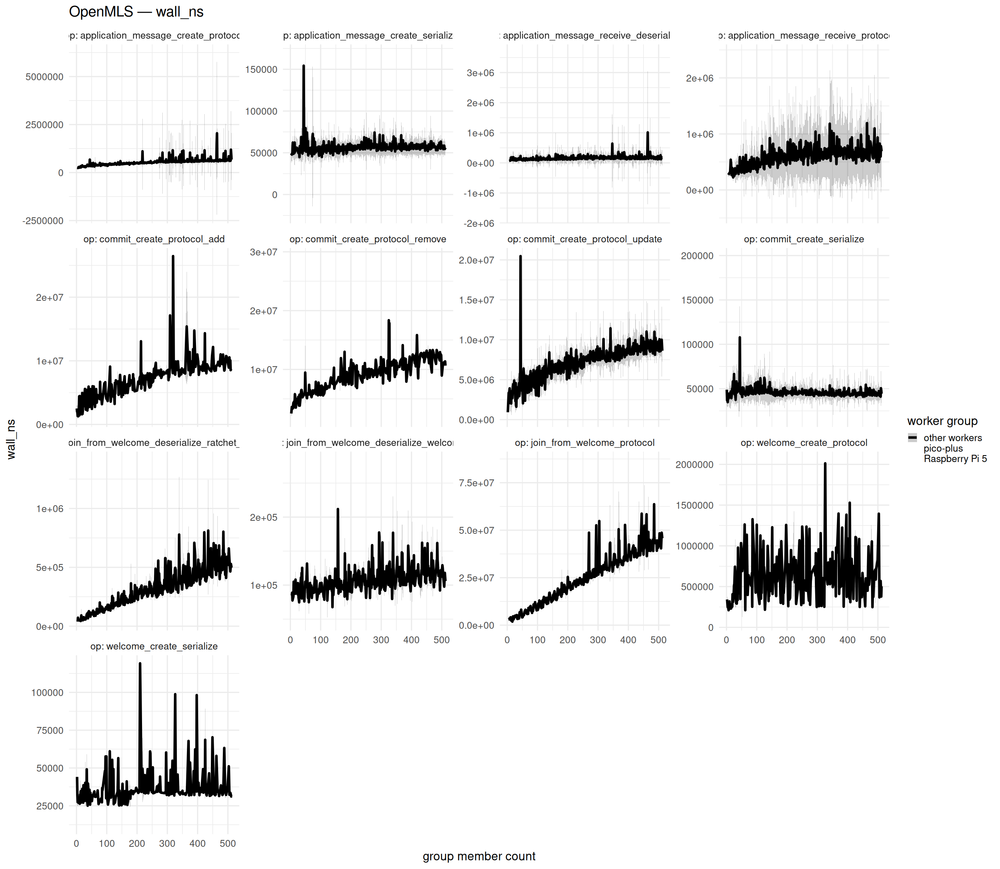

Warning message:
“Removed 1024 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


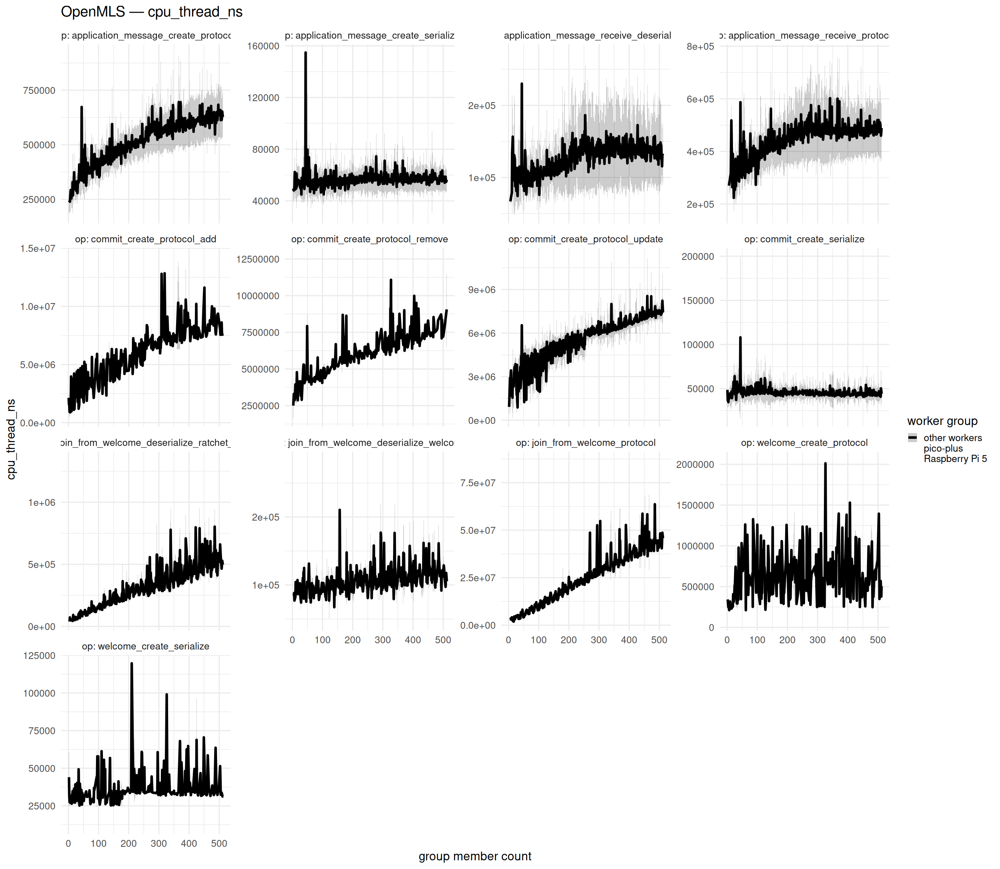

Warning message:
“Removed 1024 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


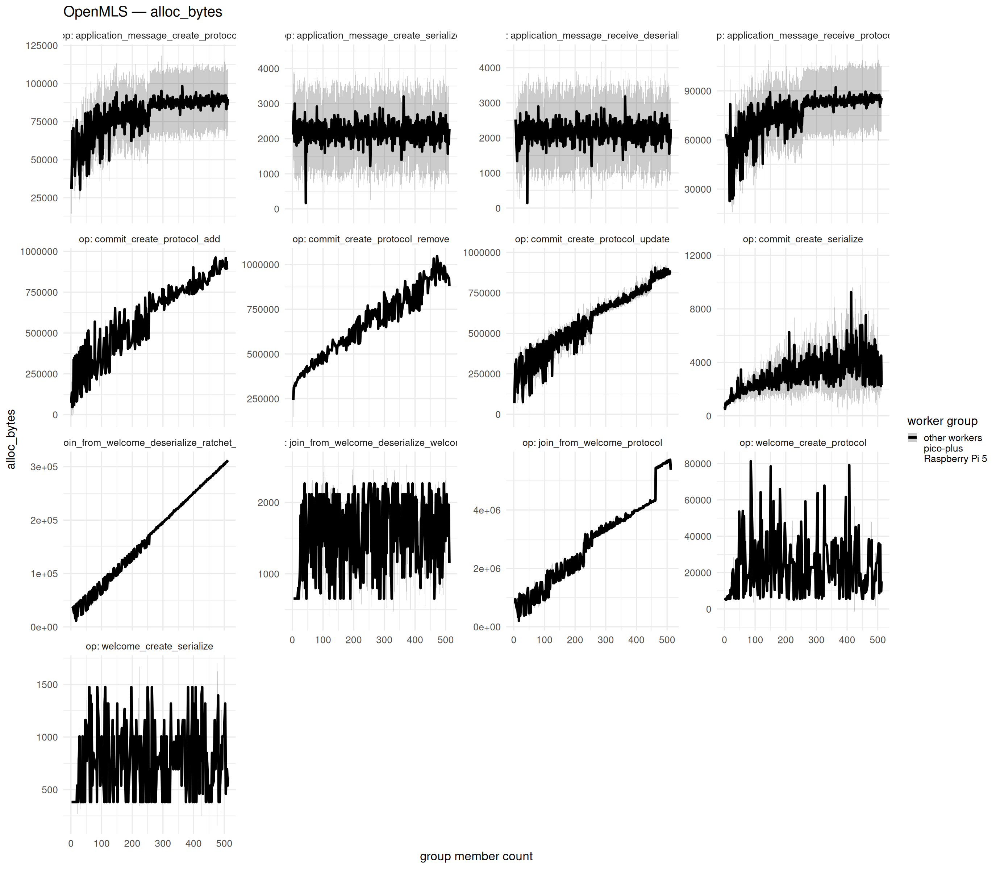

Warning message:
“Removed 1024 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


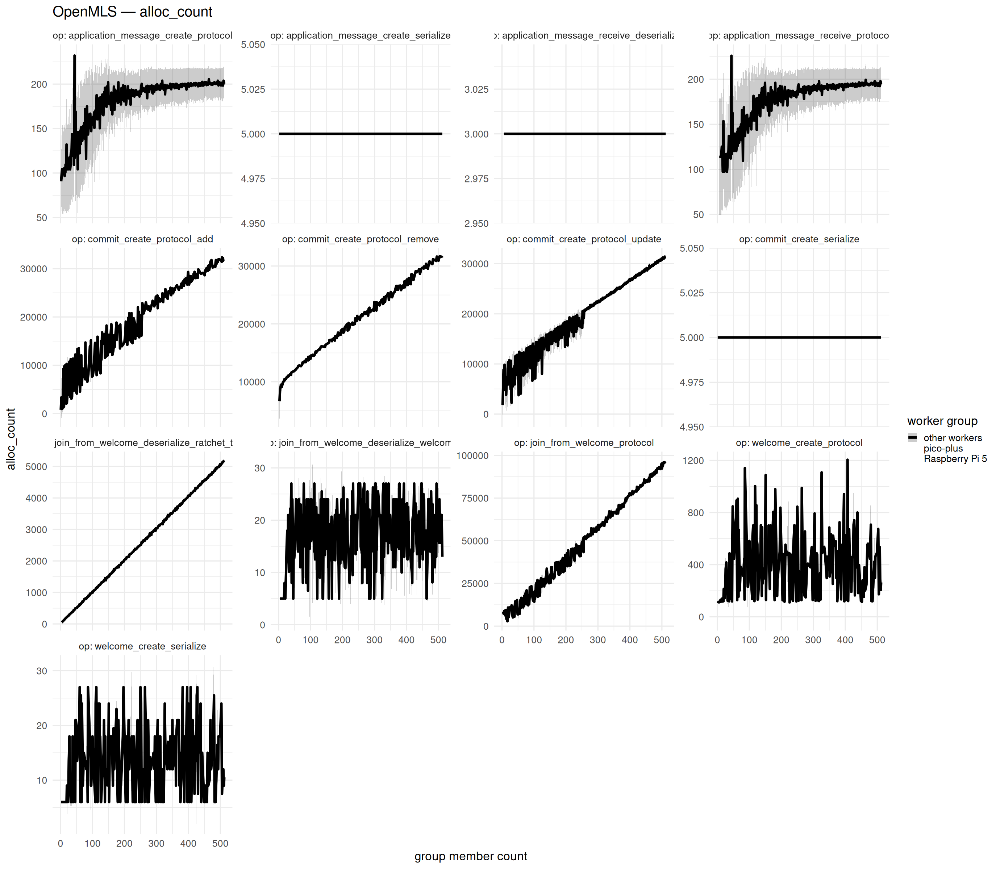

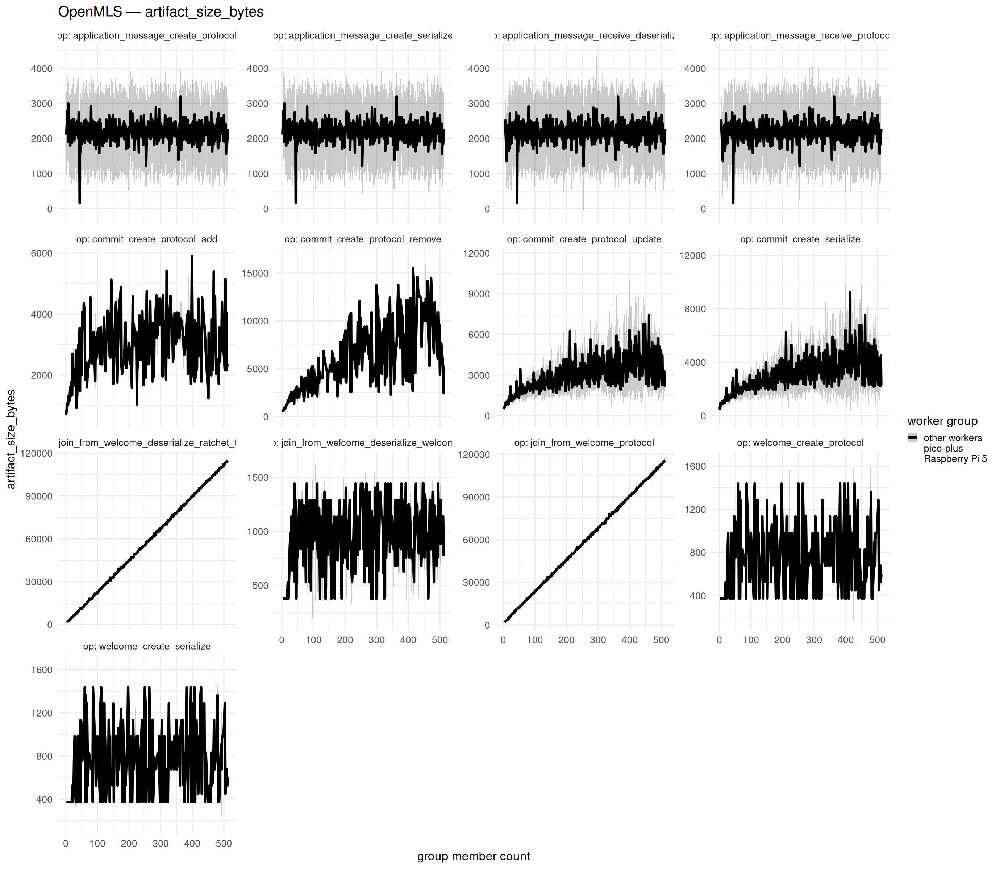

In [1]:
library(dplyr)
library(tidyr)
library(purrr)
library(readr)
library(ggplot2)
library(glue)

options(repr.plot.width = 23, repr.plot.height = 20)

openmls_worker_palette <- c(
  "other workers" = "black",
  "pico-plus" = "red",
  "Raspberry Pi 5" = "#0072B2"
)

classify_openmls_workers <- function(df) {
  if (!"client_id" %in% names(df)) df$client_id <- NA_character_
  if (!"worker_id" %in% names(df)) df$worker_id <- NA_character_
  if (!"device_kind" %in% names(df)) df$device_kind <- NA_character_

  df |>
    mutate(
      n_members = member_count,
      worker_group = case_when(
        !is.na(device_kind) & device_kind == "raspberry_pi_5" ~ "Raspberry Pi 5",
        !is.na(client_id) & grepl("^raspi5-", as.character(client_id)) ~ "Raspberry Pi 5",
        !is.na(worker_id) & grepl("^raspi5-", as.character(worker_id)) ~ "Raspberry Pi 5",
        !is.na(device_kind) & device_kind == "luckfox_pico_plus" ~ "pico-plus",
        !is.na(client_id) & grepl("^pico-plus-", as.character(client_id)) ~ "pico-plus",
        !is.na(worker_id) & grepl("^pico-plus-", as.character(worker_id)) ~ "pico-plus",
        TRUE ~ "other workers"
      ),
      worker_group = factor(worker_group, levels = names(openmls_worker_palette))
    )
}


# ---- read OpenMLS runs ----
read_openmls <- function() {
  files <- Sys.glob("OpenMLS_containerized/benchmark_output/*/events.csv")
  if (length(files) == 0) stop("No OpenMLS events.csv files found")

  map_dfr(files, read_csv, show_col_types = FALSE, .id = "source_file") |>
    classify_openmls_workers()
}

omls <- read_openmls()

# ---- summarise: mean +- sd per (worker group, op, n_members) ----
metrics <- intersect(
  c(
    "wall_ns",
    "cpu_thread_ns",
    "alloc_bytes",
    "alloc_count",
    "artifact_size_bytes"
  ),
  names(omls)
)

d_omls <- omls |>
  group_by(worker_group, op, n_members) |>
  summarise(
    across(
      all_of(metrics),
      list(
        m = ~ mean(., na.rm = TRUE),
        s = ~ sd(., na.rm = TRUE)
      )
    ),
    .groups = "drop"
  )

# ---- plot all metric~op combinations ----
for (m in metrics) {
  p <- ggplot(
    d_omls,
    aes(
      x = n_members,
      color = worker_group,
      fill = worker_group,
      group = worker_group
    )
  ) +
    geom_ribbon(
      aes(
        ymin = .data[[glue("{m}_m")]] - .data[[glue("{m}_s")]],
        ymax = .data[[glue("{m}_m")]] + .data[[glue("{m}_s")]]
      ),
      alpha = 0.2,
      color = NA
    ) +
    geom_line(
      aes(y = .data[[glue("{m}_m")]]),
      linewidth = 2
    ) +
    facet_wrap(~op, scales = "free_y", labeller = label_both) +
    scale_color_manual(values = openmls_worker_palette, drop = FALSE) +
    scale_fill_manual(values = openmls_worker_palette, drop = FALSE) +
    labs(
      title = glue("OpenMLS — {m}"),
      x = "group member count",
      y = m,
      color = "worker group",
      fill = "worker group"
    ) +
    theme_minimal(base_size = 20)

  print(p)
}


Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


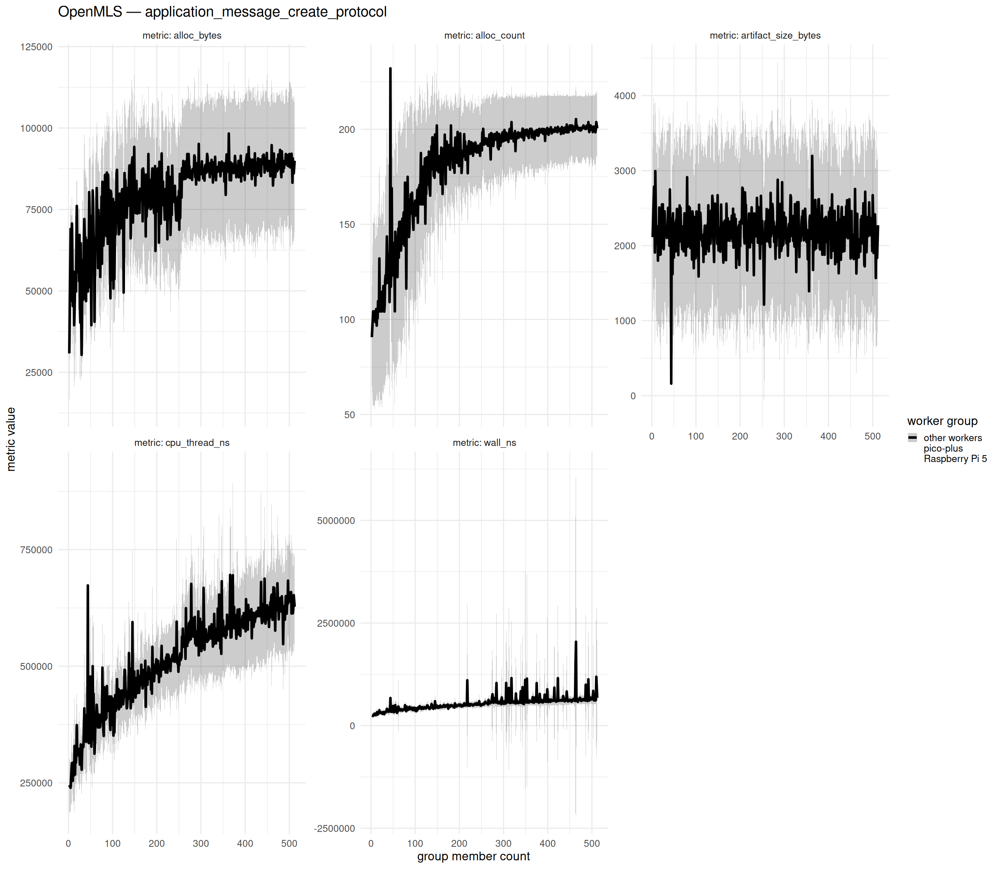

Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


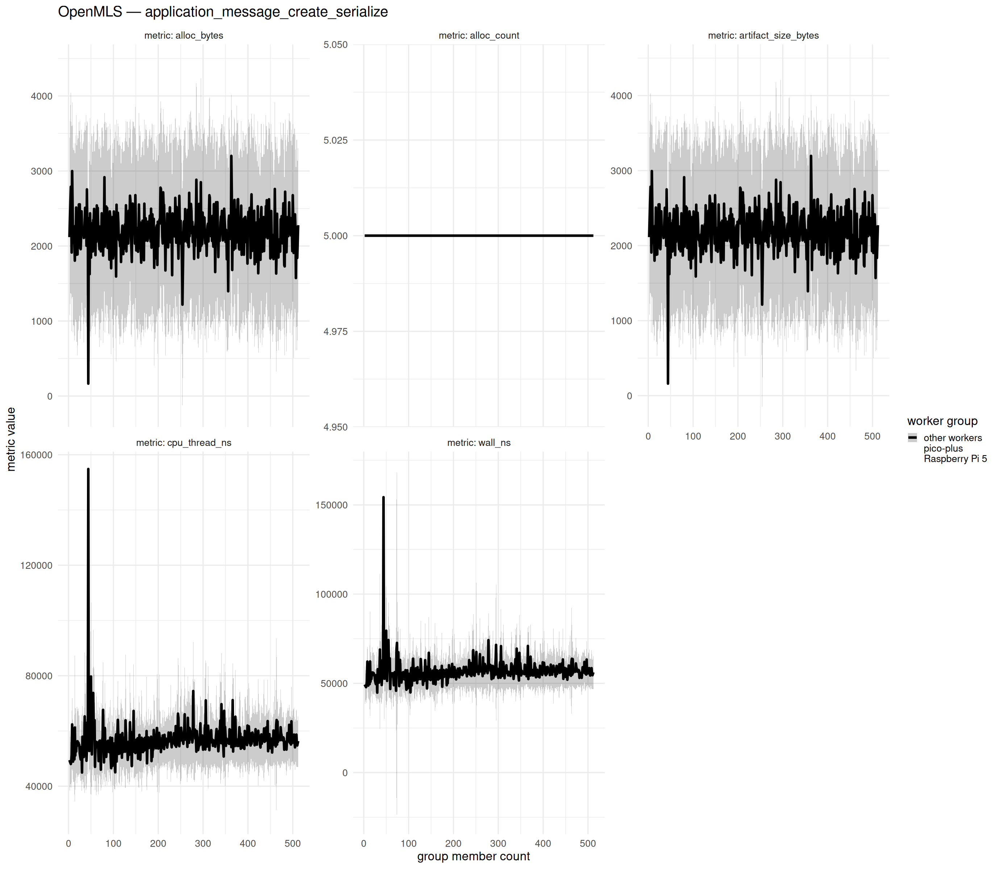

Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


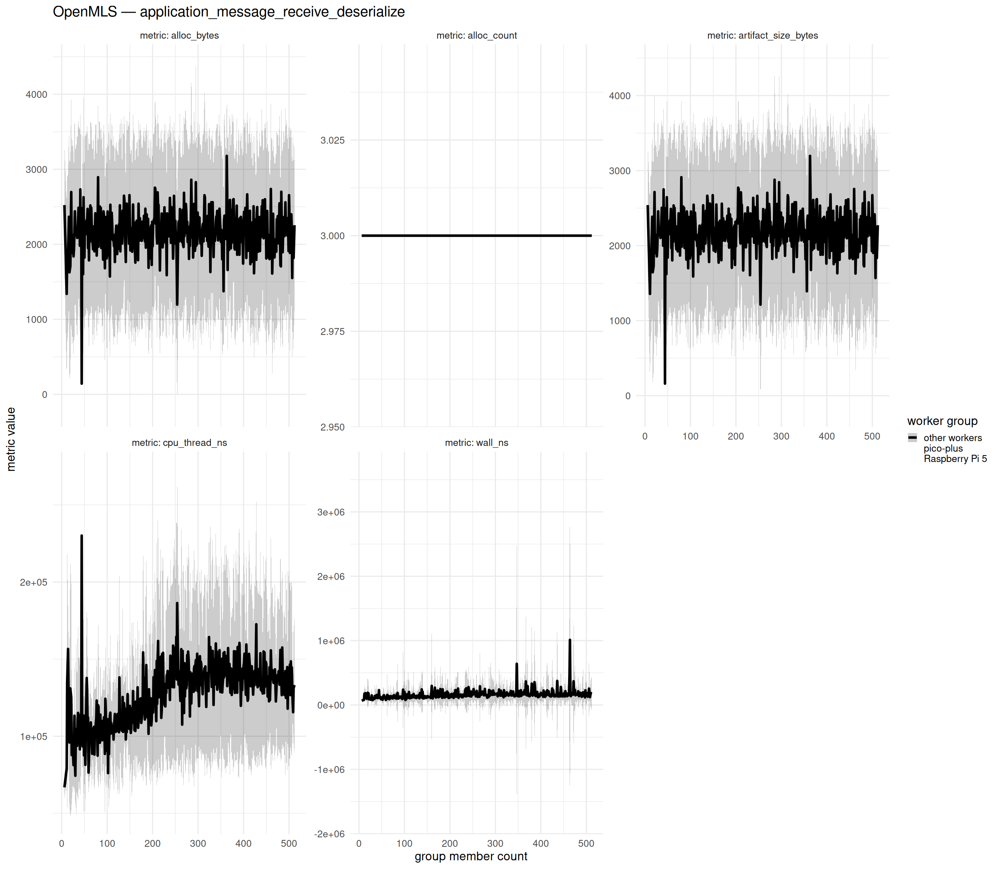

Warning message:
“Removed 835 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


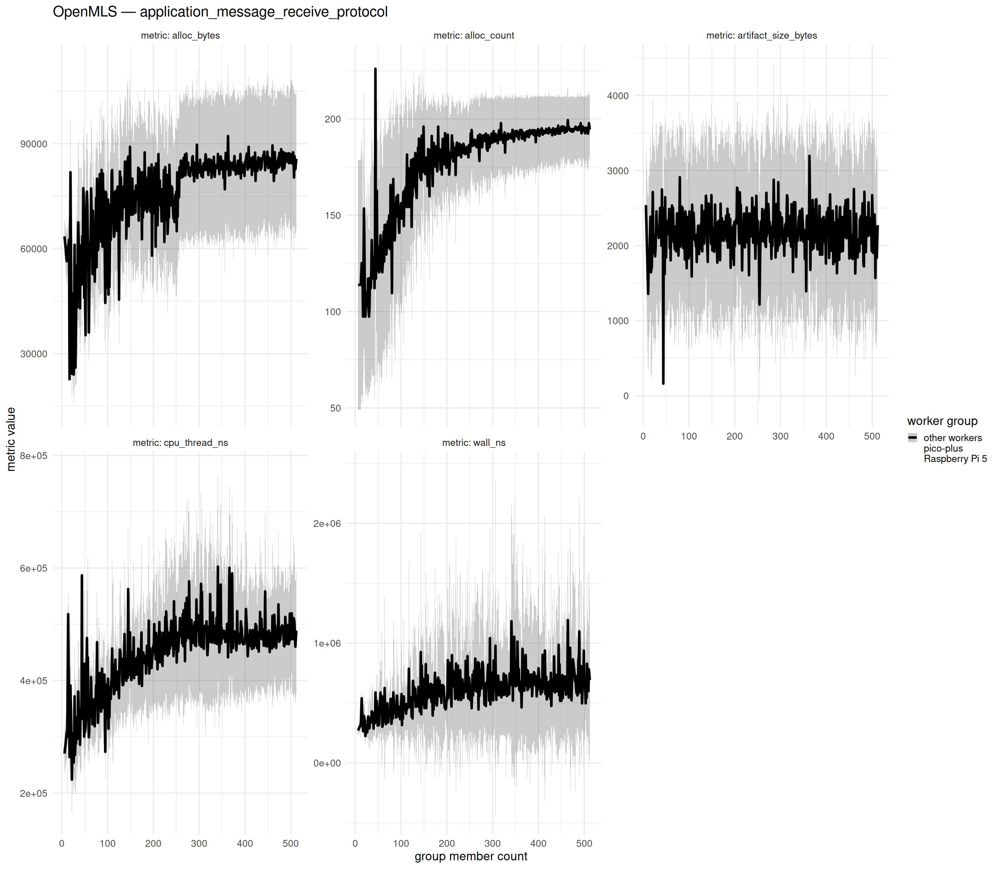

Warning message:
“Removed 875 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


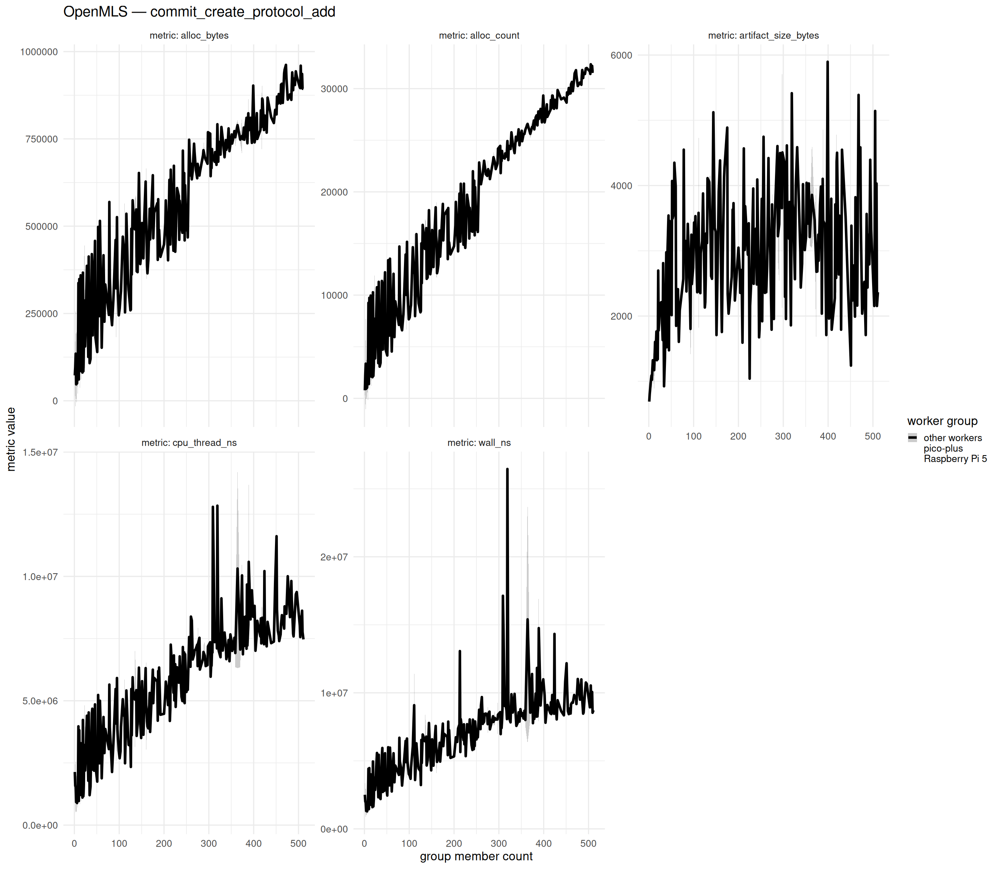

Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


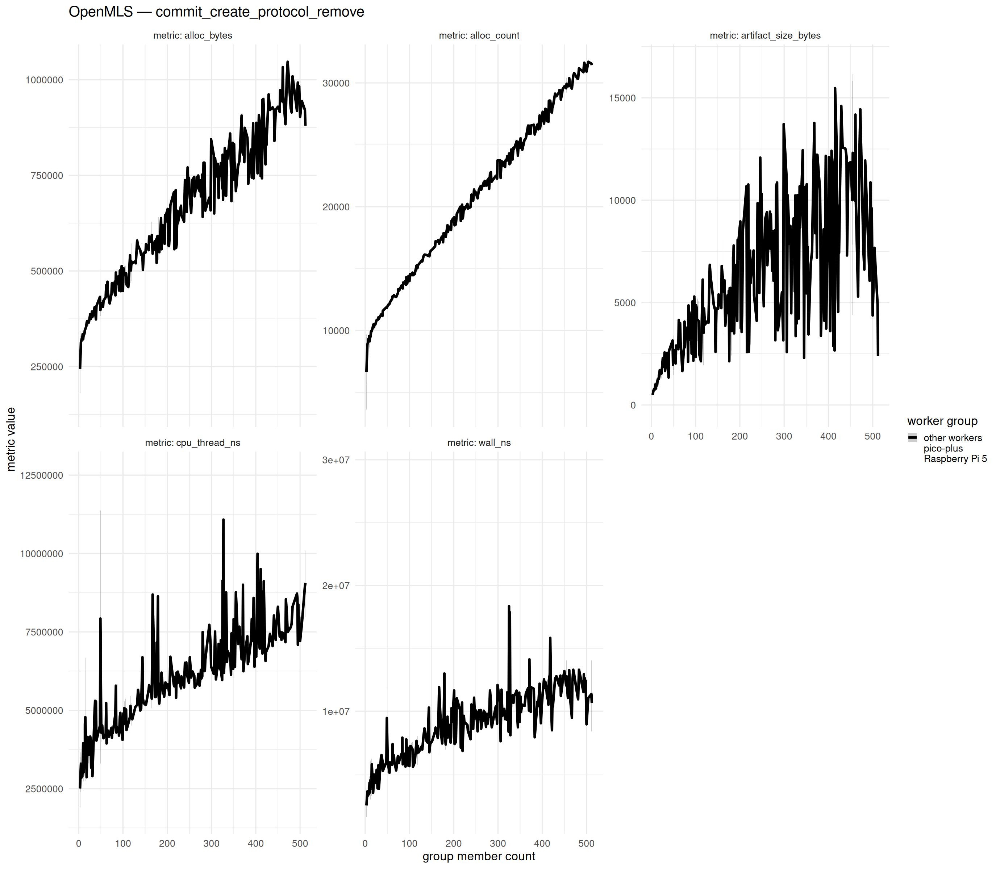

Warning message:
“Removed 10 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


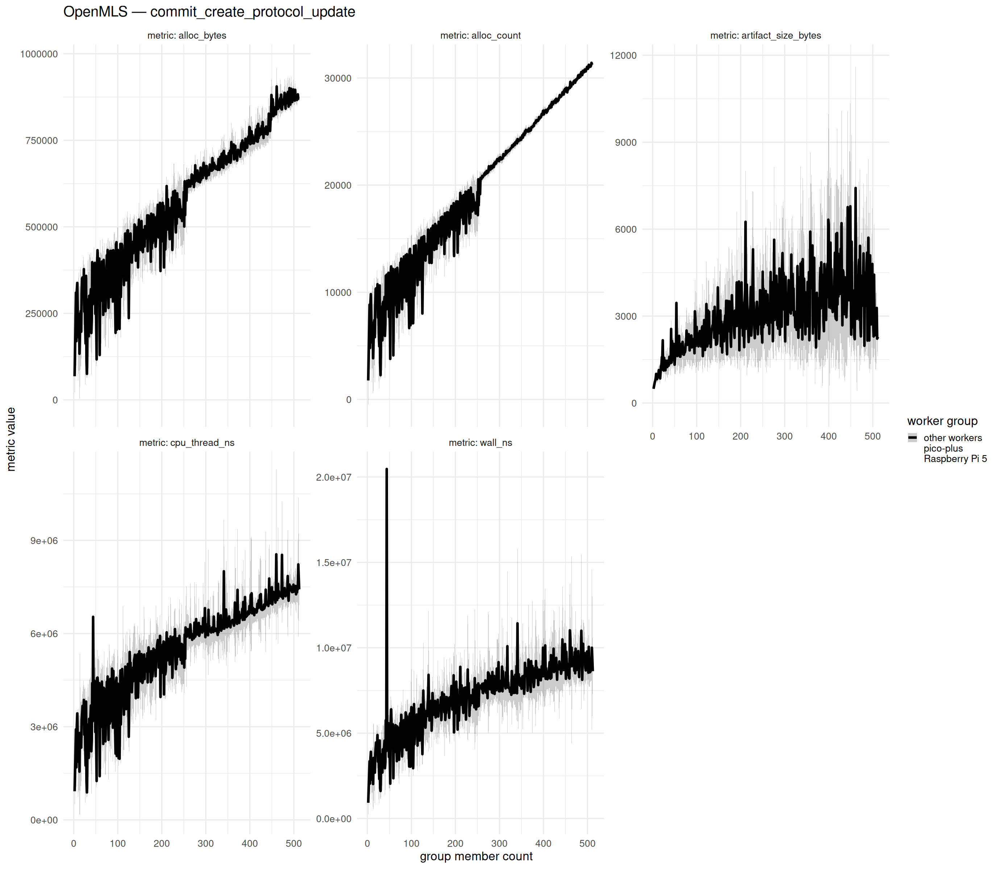

Warning message:
“Removed 575 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


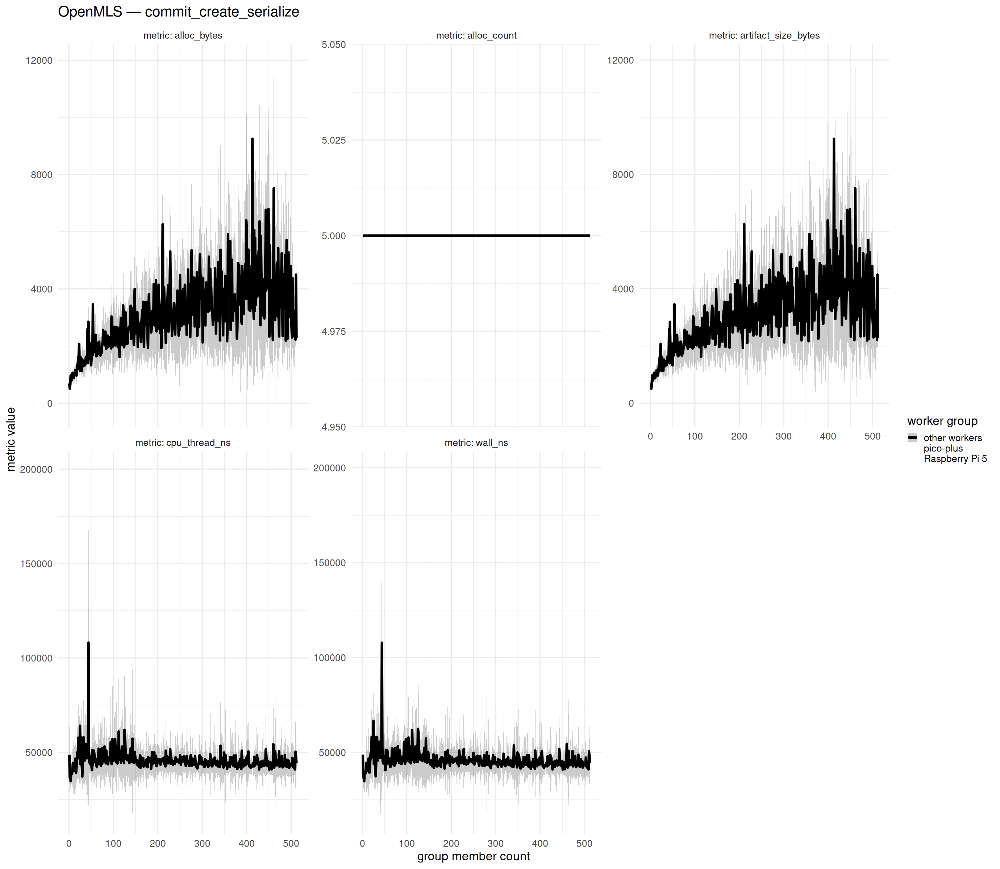

Warning message:
“Removed 575 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


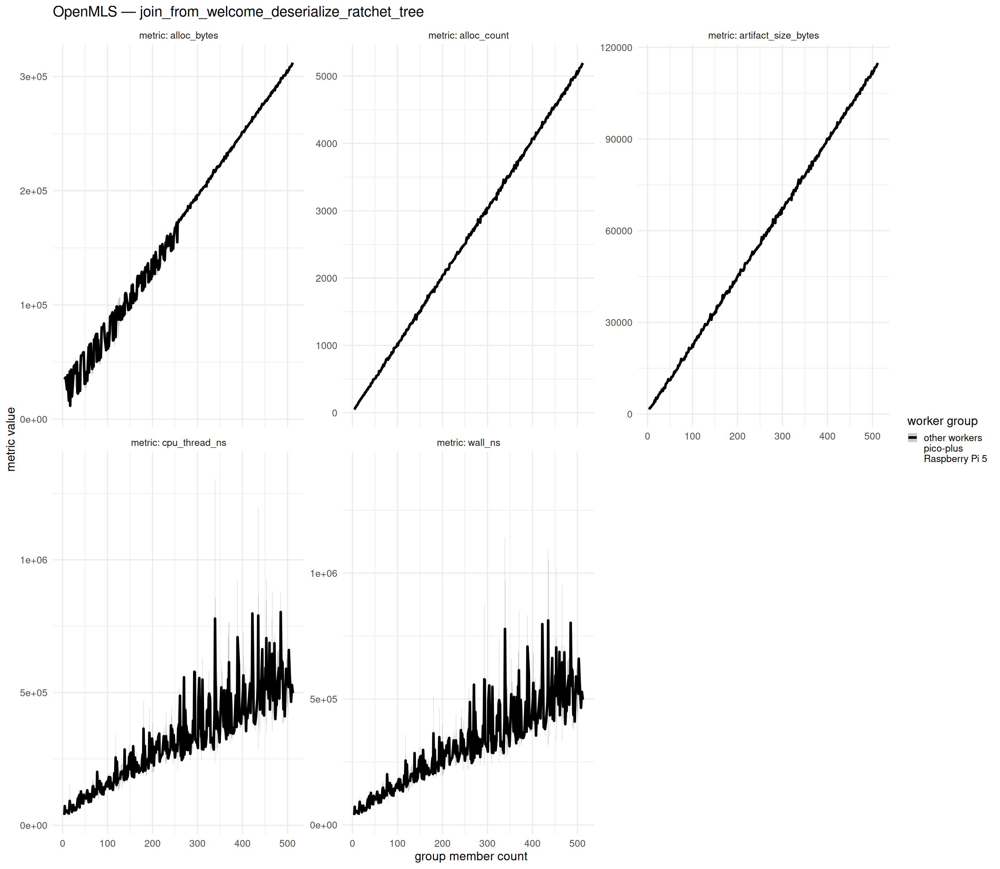

Warning message:
“Removed 575 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


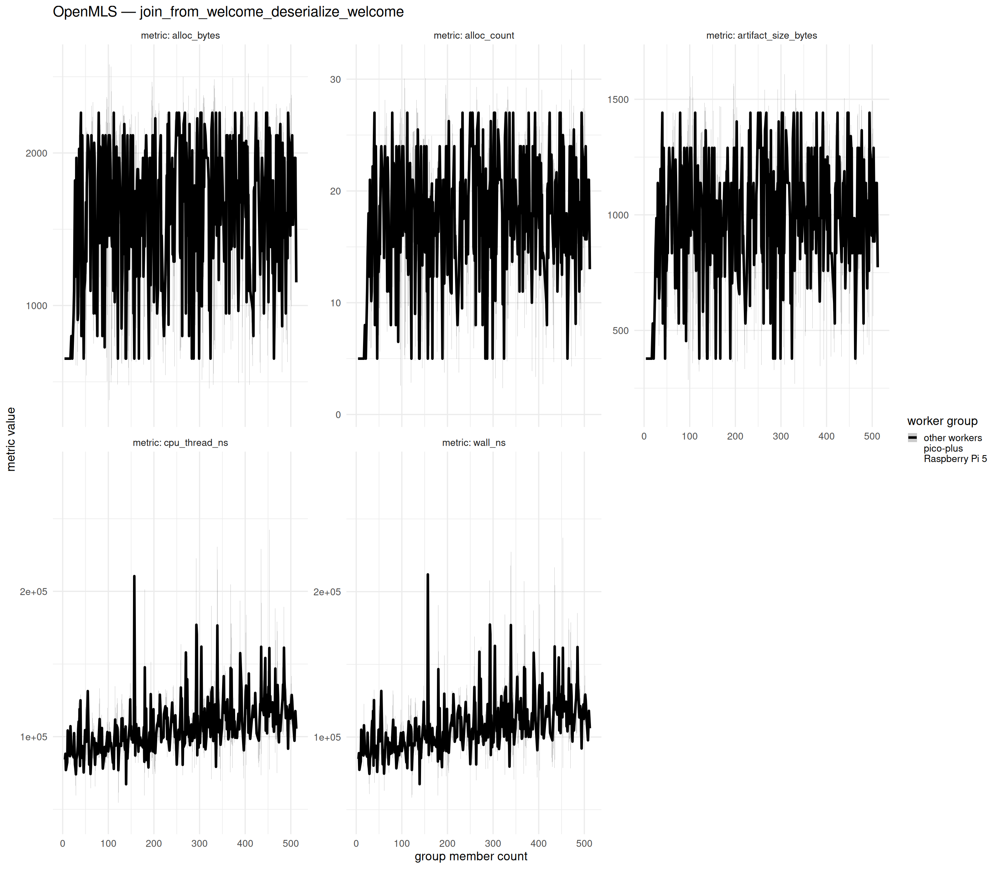

Warning message:
“Removed 825 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


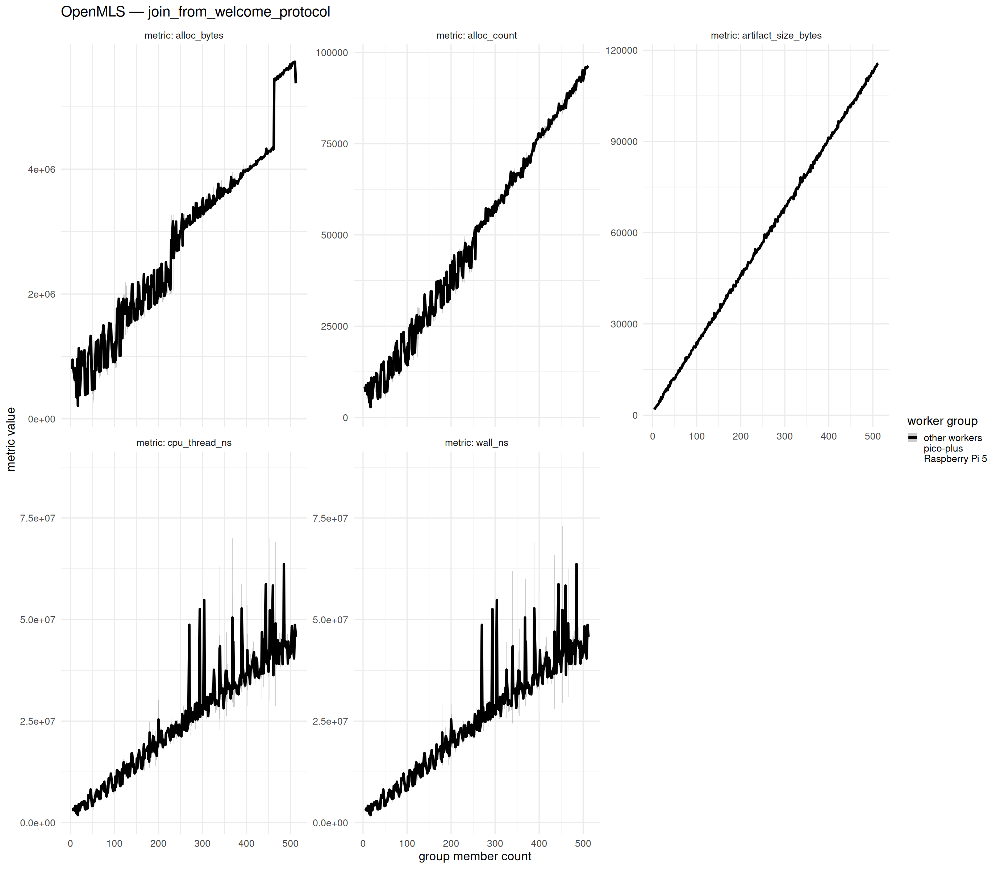

Warning message:
“Removed 825 rows containing missing values or values outside the scale range
(`geom_ribbon()`).”


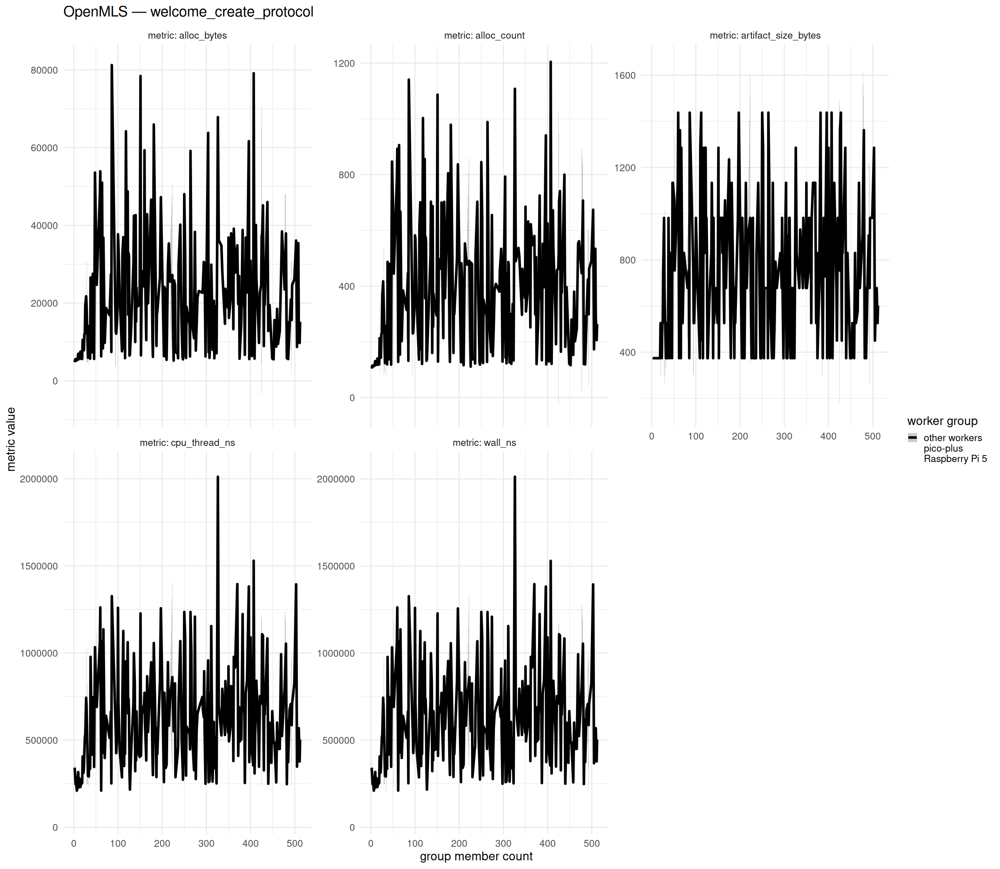

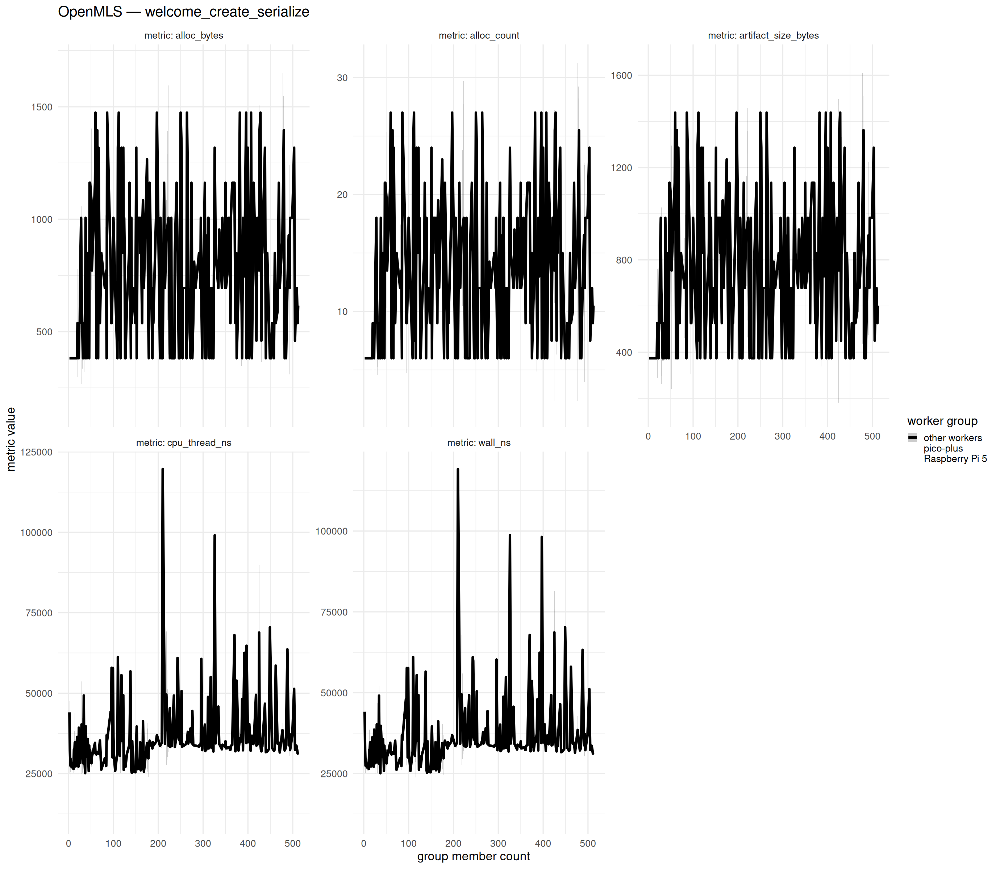

In [2]:
library(dplyr)
library(tidyr)
library(purrr)
library(readr)
library(ggplot2)
library(glue)

options(repr.plot.width = 23, repr.plot.height = 20)

openmls_worker_palette <- c(
  "other workers" = "black",
  "pico-plus" = "red",
  "Raspberry Pi 5" = "#0072B2"
)

classify_openmls_workers <- function(df) {
  if (!"client_id" %in% names(df)) df$client_id <- NA_character_
  if (!"worker_id" %in% names(df)) df$worker_id <- NA_character_
  if (!"device_kind" %in% names(df)) df$device_kind <- NA_character_

  df |>
    mutate(
      n_members = member_count,
      worker_group = case_when(
        !is.na(device_kind) & device_kind == "raspberry_pi_5" ~ "Raspberry Pi 5",
        !is.na(client_id) & grepl("^raspi5-", as.character(client_id)) ~ "Raspberry Pi 5",
        !is.na(worker_id) & grepl("^raspi5-", as.character(worker_id)) ~ "Raspberry Pi 5",
        !is.na(device_kind) & device_kind == "luckfox_pico_plus" ~ "pico-plus",
        !is.na(client_id) & grepl("^pico-plus-", as.character(client_id)) ~ "pico-plus",
        !is.na(worker_id) & grepl("^pico-plus-", as.character(worker_id)) ~ "pico-plus",
        TRUE ~ "other workers"
      ),
      worker_group = factor(worker_group, levels = names(openmls_worker_palette))
    )
}


# ---- read OpenMLS runs ----
read_openmls <- function() {
  files <- Sys.glob("OpenMLS_containerized/benchmark_output/*/events.csv")
  if (length(files) == 0) stop("No OpenMLS events.csv files found")

  map_dfr(files, read_csv, show_col_types = FALSE, .id = "source_file") |>
    classify_openmls_workers()
}

omls <- read_openmls()

# ---- summarise: mean +- sd per (worker group, op, n_members) ----
metrics <- intersect(
  c(
    "wall_ns",
    "cpu_thread_ns",
    "alloc_bytes",
    "alloc_count",
    "artifact_size_bytes"
  ),
  names(omls)
)

d_omls <- omls |>
  group_by(worker_group, op, n_members) |>
  summarise(
    across(
      all_of(metrics),
      list(
        m = ~ mean(., na.rm = TRUE),
        s = ~ sd(., na.rm = TRUE)
      )
    ),
    .groups = "drop"
  )

# ---- reshape so metrics can be faceted within each operation ----
d_omls_long <- d_omls |>
  pivot_longer(
    cols = matches("_(m|s)$"),
    names_to = c("metric", ".value"),
    names_pattern = "^(.*)_(m|s)$"
  )

# ---- plot all metrics grouped per individual operation ----
for (operation in sort(unique(d_omls_long$op))) {
  p <- d_omls_long |>
    filter(op == operation) |>
    ggplot(
      aes(
        x = n_members,
        color = worker_group,
        fill = worker_group,
        group = worker_group
      )
    ) +
    geom_ribbon(
      aes(
        ymin = m - s,
        ymax = m + s
      ),
      alpha = 0.2,
      color = NA
    ) +
    geom_line(
      aes(y = m),
      linewidth = 2
    ) +
    facet_wrap(
      ~metric,
      scales = "free_y",
      labeller = label_both
    ) +
    scale_color_manual(values = openmls_worker_palette, drop = FALSE) +
    scale_fill_manual(values = openmls_worker_palette, drop = FALSE) +
    labs(
      title = glue("OpenMLS — {operation}"),
      x = "group member count",
      y = "metric value",
      color = "worker group",
      fill = "worker group"
    ) +
    theme_minimal(base_size = 20)

  print(p)
}


In [ ]:
library(dplyr)
library(tidyr)
library(purrr)
library(readr)
library(ggplot2)
library(glue)

options(repr.plot.width = 23, repr.plot.height = 16)

signal_worker_palette <- c(
  "other workers" = "black",
  "pico-plus" = "red",
  "Raspberry Pi 5" = "#0072B2"
)

signal_blank_to_na <- function(x) {
  x <- as.character(x)
  x[x == ""] <- NA_character_
  x
}

signal_num <- function(x) {
  suppressWarnings(as.numeric(x))
}

signal_max_or_na <- function(x) {
  x <- x[!is.na(x)]
  if (length(x) == 0) return(NA_real_)
  max(x)
}

signal_quantile_or_na <- function(x, p) {
  x <- x[!is.na(x)]
  if (length(x) == 0) return(NA_real_)
  as.numeric(quantile(x, p, names = FALSE, type = 7))
}

signal_mean_or_na <- function(x) {
  x <- x[!is.na(x)]
  if (length(x) == 0) return(NA_real_)
  mean(x)
}

signal_sd_or_na <- function(x) {
  x <- x[!is.na(x)]
  if (length(x) <= 1) return(NA_real_)
  sd(x)
}

signal_ensure_columns <- function(df) {
  required_columns <- c(
    "source_path",
    "source_run",
    "profile_schema_version",
    "participant_id",
    "physical_worker_id",
    "client_id",
    "worker_id",
    "container_mode",
    "execution_backend",
    "device_kind",
    "transport",
    "access_backend",
    "arch",
    "rust_target",
    "op",
    "protocol_stack",
    "implementation",
    "measurement_class",
    "participant_device_id",
    "role",
    "peer_id",
    "peer_device_id",
    "peer_count",
    "event_family",
    "event_subtype",
    "event_side",
    "direction",
    "phase",
    "success",
    "wall_ns",
    "cpu_thread_ns",
    "alloc_bytes",
    "alloc_count",
    "artifact_size_bytes",
    "participant_count",
    "conversation_size",
    "prekey_bundle_count",
    "session_count",
    "ratchet_step_count",
    "ciphertext_bytes",
    "plaintext_bytes",
    "run_id",
    "scenario",
    "logical_worker_count",
    "physical_worker_count",
    "singleton_count",
    "packed_clients_per_container",
    "layout_mode",
    "resource_limit_cpus",
    "resource_limit_memory",
    "resource_limit_memory_bytes",
    "resource_limit_memory_swap",
    "resource_limit_memory_swap_bytes",
    "resource_limit_pids",
    "resource_profile"
  )

  for (col in required_columns) {
    if (!col %in% names(df)) df[[col]] <- NA
  }

  df
}

classify_signal_workers <- function(df) {
  df |>
    signal_ensure_columns() |>
    mutate(
      across(
        c(
          profile_schema_version,
          peer_count,
          wall_ns,
          cpu_thread_ns,
          alloc_bytes,
          alloc_count,
          artifact_size_bytes,
          participant_count,
          conversation_size,
          prekey_bundle_count,
          session_count,
          ratchet_step_count,
          ciphertext_bytes,
          plaintext_bytes,
          logical_worker_count,
          physical_worker_count,
          singleton_count,
          packed_clients_per_container,
          resource_limit_cpus,
          resource_limit_memory_bytes,
          resource_limit_memory_swap_bytes,
          resource_limit_pids
        ),
        signal_num
      ),
      across(
        c(
          protocol_stack,
          implementation,
          measurement_class,
          participant_id,
          physical_worker_id,
          client_id,
          worker_id,
          container_mode,
          execution_backend,
          device_kind,
          transport,
          access_backend,
          arch,
          rust_target,
          op,
          role,
          peer_id,
          event_family,
          event_subtype,
          event_side,
          direction,
          phase,
          run_id,
          scenario,
          layout_mode,
          resource_limit_memory,
          resource_limit_memory_swap,
          resource_profile,
          source_run
        ),
        signal_blank_to_na
      ),
      n_members = coalesce(conversation_size, participant_count, logical_worker_count),
      signal_operation = coalesce(event_family, op),
      signal_detail = coalesce(event_subtype, op),
      schema_generation = case_when(
        !is.na(profile_schema_version) & profile_schema_version >= 2 ~ "refactored schema",
        !is.na(protocol_stack) ~ "refactored schema",
        TRUE ~ "legacy schema"
      ),
      worker_group = case_when(
        !is.na(device_kind) & device_kind == "raspberry_pi_5" ~ "Raspberry Pi 5",
        !is.na(client_id) & grepl("^raspi5-", client_id) ~ "Raspberry Pi 5",
        !is.na(worker_id) & grepl("^raspi5-", worker_id) ~ "Raspberry Pi 5",
        !is.na(participant_id) & grepl("^raspi5-", participant_id) ~ "Raspberry Pi 5",
        !is.na(physical_worker_id) & grepl("^raspi5-", physical_worker_id) ~ "Raspberry Pi 5",
        !is.na(device_kind) & device_kind == "luckfox_pico_plus" ~ "pico-plus",
        !is.na(client_id) & grepl("^pico-plus-", client_id) ~ "pico-plus",
        !is.na(worker_id) & grepl("^pico-plus-", worker_id) ~ "pico-plus",
        !is.na(participant_id) & grepl("^pico-plus-", participant_id) ~ "pico-plus",
        !is.na(physical_worker_id) & grepl("^pico-plus-", physical_worker_id) ~ "pico-plus",
        TRUE ~ "other workers"
      ),
      worker_group = factor(worker_group, levels = names(signal_worker_palette))
    )
}

# ---- read Signal runs ----
read_signal <- function() {
  signal_events_glob <- if (dir.exists("Signal_containerized/benchmark_output")) {
    "Signal_containerized/benchmark_output/*/events.csv"
  } else {
    "benchmark_output/*/events.csv"
  }
  files <- sort(Sys.glob(signal_events_glob))
  if (length(files) == 0) stop("No Signal events.csv files found")

  map_dfr(files, function(path) {
    read_csv(path, show_col_types = FALSE, progress = FALSE) |>
      mutate(source_path = path, source_run = basename(dirname(path)))
  }) |>
    classify_signal_workers()
}

sig <- read_signal()

bad_signal_markers <- c(paste0("_com", "mit"), paste0("wel", "come"), "proposal", "epoch")
observed_forbidden_signal_ops <- sig |>
  filter(!is.na(signal_operation)) |>
  distinct(signal_operation) |>
  pull(signal_operation) |>
  keep(~ any(map_lgl(bad_signal_markers, function(marker) grepl(marker, tolower(.x), fixed = TRUE)))) |>
  sort()

if (length(observed_forbidden_signal_ops) > 0) {
  stop(glue("Found non-Signal operation names: {paste(observed_forbidden_signal_ops, collapse = ', ')}"))
}

signal_schema_summary <- sig |>
  group_by(source_run, schema_generation, protocol_stack, profile_schema_version) |>
  summarise(
    rows = n(),
    success_rows = sum(tolower(as.character(success)) == "true", na.rm = TRUE),
    failed_rows = sum(!is.na(success) & tolower(as.character(success)) != "true", na.rm = TRUE),
    operations = n_distinct(signal_operation, na.rm = TRUE),
    max_n_members = signal_max_or_na(n_members),
    max_session_count = signal_max_or_na(session_count),
    participants_seen = n_distinct(participant_id, na.rm = TRUE),
    singleton_rows = sum(container_mode == "singleton", na.rm = TRUE),
    singleton_rows_with_resource_caps = sum(
      container_mode == "singleton" &
        !is.na(resource_limit_cpus) &
        !is.na(resource_limit_memory_bytes) &
        !is.na(resource_limit_pids),
      na.rm = TRUE
    ),
    .groups = "drop"
  ) |>
  arrange(schema_generation, source_run)

print(signal_schema_summary, n = Inf)

sig_refactored <- sig |>
  filter(schema_generation == "refactored schema", protocol_stack == "signal")

if (nrow(sig_refactored) == 0) {
  stop("No refactored Signal rows found. Re-run Signal_containerized with the refactored event schema first.")
}

expected_signal_families <- c(
  "identity_bootstrap",
  "identity_and_prekey_preparation",
  "prekey_publication",
  "session_establishment",
  "message_protection",
  "message_recovery",
  "participant_lifecycle"
)

missing_signal_families <- setdiff(expected_signal_families, unique(na.omit(sig_refactored$event_family)))
if (length(missing_signal_families) > 0) {
  message("Missing expected Signal event families: ", paste(missing_signal_families, collapse = ", "))
} else {
  message("All expected Signal event families are present in the refactored runs.")
}

signal_protocol_coverage <- sig_refactored |>
  count(measurement_class, event_family, event_subtype, event_side, direction, role, sort = TRUE)

print(signal_protocol_coverage, n = Inf)

signal_metrics <- c(
  "wall_ns",
  "cpu_thread_ns",
  "alloc_bytes",
  "alloc_count",
  "artifact_size_bytes",
  "prekey_bundle_count",
  "session_count",
  "ratchet_step_count",
  "ciphertext_bytes",
  "plaintext_bytes",
  "peer_count"
)

present_signal_metrics <- intersect(signal_metrics, names(sig_refactored))

signal_missingness <- sig_refactored |>
  select(worker_group, signal_operation, signal_detail, all_of(present_signal_metrics)) |>
  pivot_longer(all_of(present_signal_metrics), names_to = "metric", values_to = "value") |>
  group_by(worker_group, signal_operation, signal_detail, metric) |>
  summarise(
    rows = n(),
    non_missing = sum(!is.na(value)),
    missing = sum(is.na(value)),
    pct_missing = 100 * missing / rows,
    .groups = "drop"
  ) |>
  arrange(signal_operation, signal_detail, metric, worker_group)

print(signal_missingness, n = Inf)

signal_metrics_with_values <- signal_missingness |>
  filter(non_missing > 0) |>
  distinct(metric) |>
  pull(metric)

if (length(signal_metrics_with_values) == 0) {
  stop("No numeric Signal metric values are present in refactored events.csv files.")
}

signal_summary <- sig_refactored |>
  select(worker_group, signal_operation, signal_detail, n_members, all_of(signal_metrics_with_values)) |>
  pivot_longer(all_of(signal_metrics_with_values), names_to = "metric", values_to = "value") |>
  group_by(worker_group, signal_operation, signal_detail, metric, n_members) |>
  summarise(
    n = sum(!is.na(value)),
    mean = signal_mean_or_na(value),
    median = signal_quantile_or_na(value, 0.50),
    q25 = signal_quantile_or_na(value, 0.25),
    q75 = signal_quantile_or_na(value, 0.75),
    iqr = q75 - q25,
    sd = signal_sd_or_na(value),
    ci95_low = mean - 1.96 * sd / sqrt(n),
    ci95_high = mean + 1.96 * sd / sqrt(n),
    .groups = "drop"
  ) |>
  mutate(across(c(mean, median, q25, q75, iqr, sd, ci95_low, ci95_high), ~ if_else(is.nan(.x), NA_real_, .x)))

print(signal_summary |> filter(n > 0), n = 100)

signal_summary_plot <- signal_summary |>
  filter(n > 0, !is.na(n_members))

for (operation in sort(unique(signal_summary_plot$signal_operation))) {
  plot_data <- signal_summary_plot |>
    filter(signal_operation == operation)
  line_data <- plot_data |>
    group_by(worker_group, metric) |>
    filter(n_distinct(n_members) > 1) |>
    ungroup()

  p <- ggplot(
      plot_data,
      aes(
        x = n_members,
        color = worker_group,
        fill = worker_group,
        group = worker_group
      )
    ) +
    geom_ribbon(data = line_data, aes(ymin = q25, ymax = q75), alpha = 0.18, color = NA) +
    geom_line(data = line_data, aes(y = median), linewidth = 1.1) +
    geom_point(aes(y = median), size = 1.4) +
    facet_wrap(~metric, scales = "free_y", labeller = label_both) +
    scale_color_manual(values = signal_worker_palette, drop = FALSE) +
    scale_fill_manual(values = signal_worker_palette, drop = FALSE) +
    labs(
      title = glue("Signal - {operation}"),
      x = "Signal participant count",
      y = "metric value",
      color = "worker group",
      fill = "worker group"
    ) +
    theme_minimal(base_size = 16)

  print(p)
}

signal_message_overhead <- sig_refactored |>
  filter(
    signal_operation %in% c("message_protection", "message_recovery"),
    !is.na(plaintext_bytes),
    !is.na(ciphertext_bytes),
    plaintext_bytes > 0
  ) |>
  mutate(ciphertext_over_plaintext = ciphertext_bytes / plaintext_bytes) |>
  group_by(worker_group, signal_operation, n_members) |>
  summarise(
    rows = n(),
    plaintext_median = median(plaintext_bytes, na.rm = TRUE),
    ciphertext_median = median(ciphertext_bytes, na.rm = TRUE),
    overhead_median = median(ciphertext_over_plaintext, na.rm = TRUE),
    wall_median = median(wall_ns, na.rm = TRUE),
    wall_q25 = quantile(wall_ns, 0.25, na.rm = TRUE),
    wall_q75 = quantile(wall_ns, 0.75, na.rm = TRUE),
    .groups = "drop"
  )

print(signal_message_overhead, n = Inf)

if (nrow(signal_message_overhead) > 0) {
  signal_message_line_data <- signal_message_overhead |>
    group_by(worker_group, signal_operation) |>
    filter(n_distinct(n_members) > 1) |>
    ungroup()

  ggplot(signal_message_overhead, aes(x = n_members, color = worker_group, fill = worker_group, group = worker_group)) +
    geom_ribbon(data = signal_message_line_data, aes(ymin = wall_q25, ymax = wall_q75), alpha = 0.18, color = NA) +
    geom_line(data = signal_message_line_data, aes(y = wall_median), linewidth = 1.1) +
    geom_point(aes(y = wall_median), size = 1.4) +
    facet_wrap(~signal_operation, scales = "free_y") +
    scale_color_manual(values = signal_worker_palette, drop = FALSE) +
    scale_fill_manual(values = signal_worker_palette, drop = FALSE) +
    labs(
      title = "Signal message protection and recovery",
      x = "Signal participant count",
      y = "wall_ns median",
      color = "worker group",
      fill = "worker group"
    ) +
    theme_minimal(base_size = 16)
}

signal_session_establishment <- sig_refactored |>
  filter(signal_operation == "session_establishment") |>
  group_by(worker_group, n_members, peer_count) |>
  summarise(
    rows = n(),
    session_count_median = median(session_count, na.rm = TRUE),
    ratchet_step_median = median(ratchet_step_count, na.rm = TRUE),
    wall_median = median(wall_ns, na.rm = TRUE),
    wall_q25 = quantile(wall_ns, 0.25, na.rm = TRUE),
    wall_q75 = quantile(wall_ns, 0.75, na.rm = TRUE),
    .groups = "drop"
  ) |>
  filter(!is.na(n_members))

print(signal_session_establishment, n = Inf)

if (nrow(signal_session_establishment) > 0) {
  signal_session_line_data <- signal_session_establishment |>
    group_by(worker_group) |>
    filter(n_distinct(n_members) > 1) |>
    ungroup()

  ggplot(signal_session_establishment, aes(x = n_members, color = worker_group, fill = worker_group, group = worker_group)) +
    geom_ribbon(data = signal_session_line_data, aes(ymin = wall_q25, ymax = wall_q75), alpha = 0.18, color = NA) +
    geom_line(data = signal_session_line_data, aes(y = wall_median), linewidth = 1.1) +
    geom_point(aes(y = wall_median), size = 1.4) +
    scale_color_manual(values = signal_worker_palette, drop = FALSE) +
    scale_fill_manual(values = signal_worker_palette, drop = FALSE) +
    labs(
      title = "Signal session establishment by peer fanout",
      x = "Signal participant count",
      y = "wall_ns median",
      color = "worker group",
      fill = "worker group"
    ) +
    theme_minimal(base_size = 16)
}

signal_resource_envelope <- sig_refactored |>
  group_by(
    source_run,
    layout_mode,
    container_mode,
    worker_group,
    resource_profile,
    resource_limit_cpus,
    resource_limit_memory_bytes,
    resource_limit_memory_swap_bytes,
    resource_limit_pids
  ) |>
  summarise(
    rows = n(),
    participants_seen = n_distinct(participant_id, na.rm = TRUE),
    max_n_members = signal_max_or_na(n_members),
    .groups = "drop"
  ) |>
  arrange(source_run, container_mode, worker_group)

print(signal_resource_envelope, n = Inf)


# A tibble: 468 × 7
    worker_group   op               metric  rows non_missing missing pct_missing
    <fct>          <chr>            <chr>  <int>       <int>   <int>       <dbl>
  1 other workers  application_mes… alloc…   120         120       0           0
  2 pico-plus      application_mes… alloc…   123         123       0           0
  3 Raspberry Pi 5 application_mes… alloc…   120         120       0           0
  4 other workers  application_mes… alloc…   120         120       0           0
  5 pico-plus      application_mes… alloc…   123         123       0           0
  6 Raspberry Pi 5 application_mes… alloc…   120         120       0           0
  7 other workers  application_mes… app_m…   120         120       0           0
  8 pico-plus      application_mes… app_m…   123         123       0           0
  9 Raspberry Pi 5 application_mes… app_m…   120         120       0           0
 10 other workers  application_mes… app_m…   120         120       0           0
 11 pico

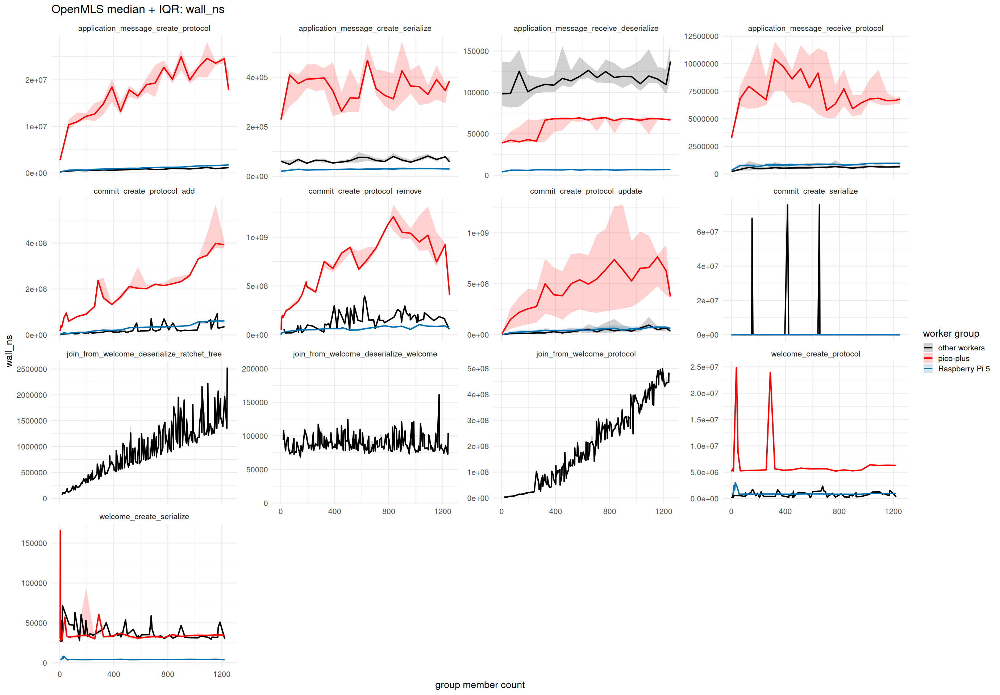

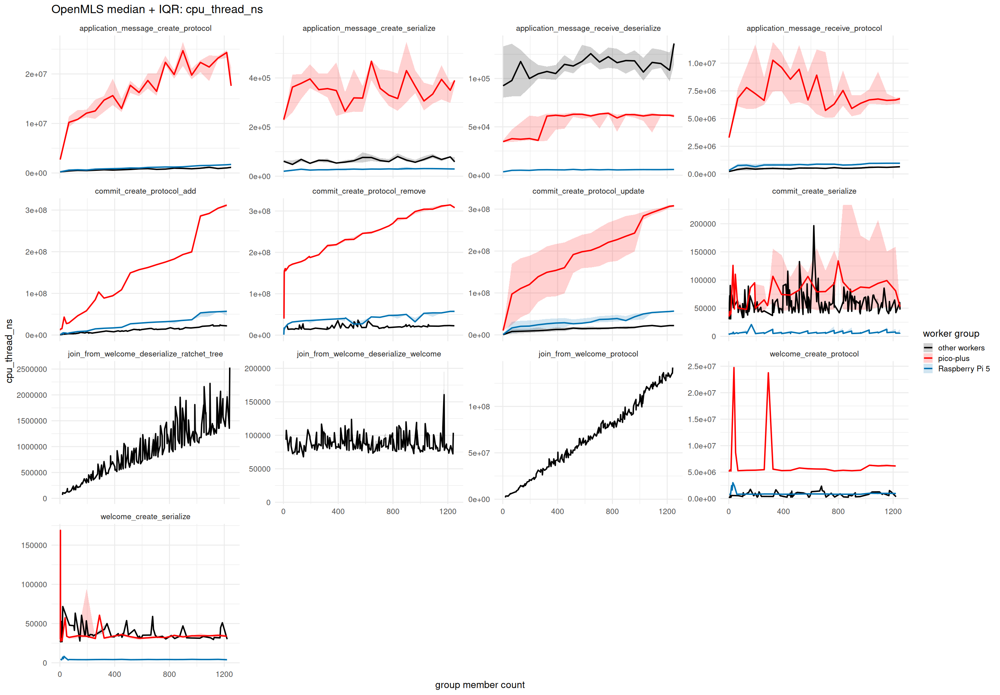

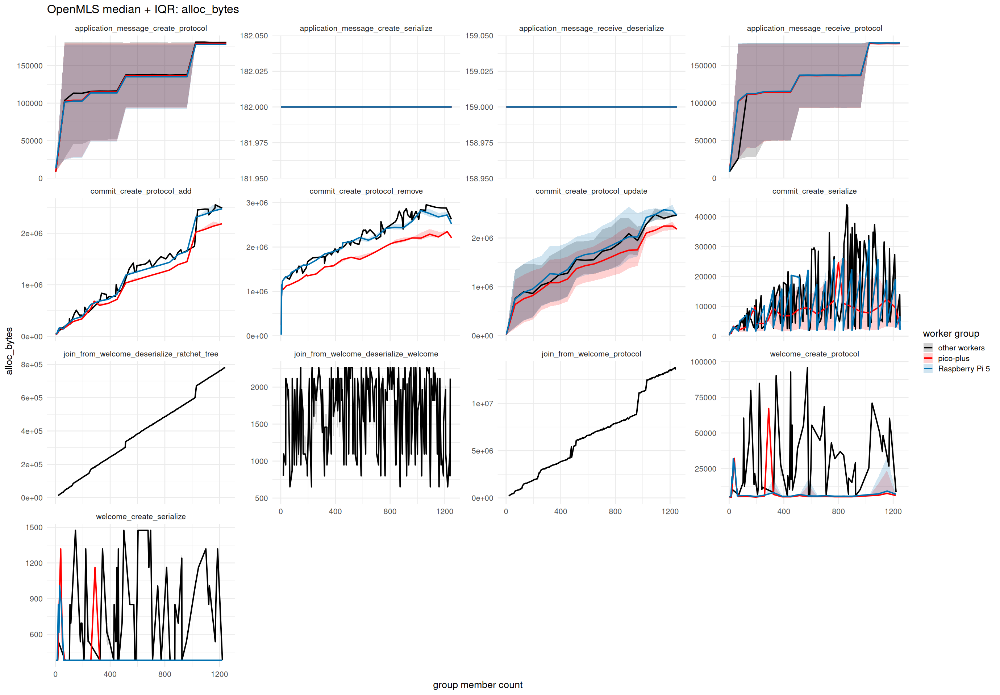

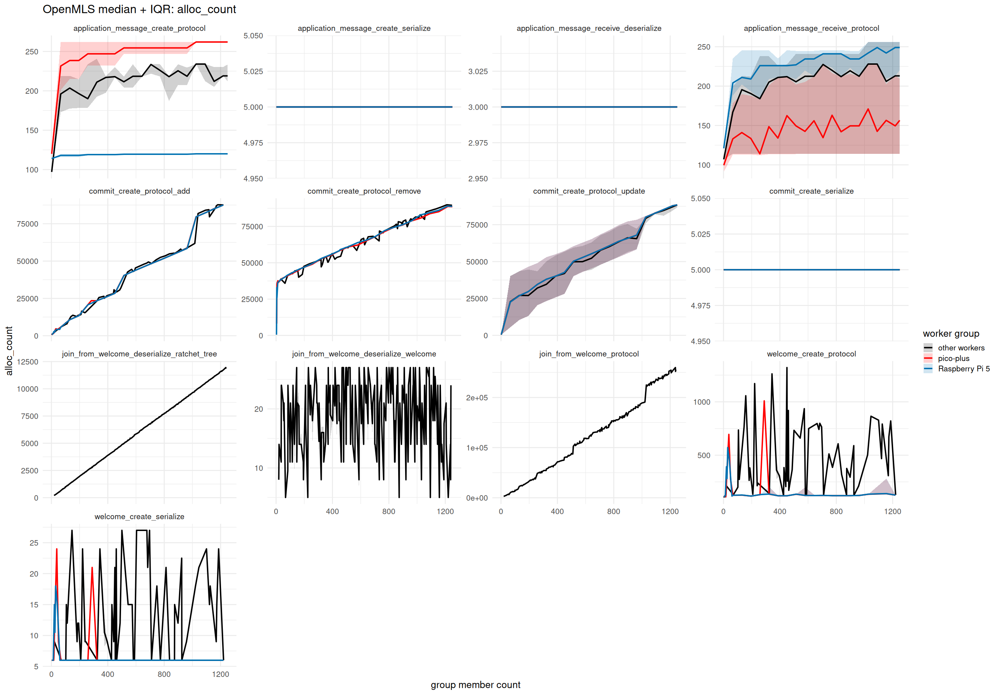

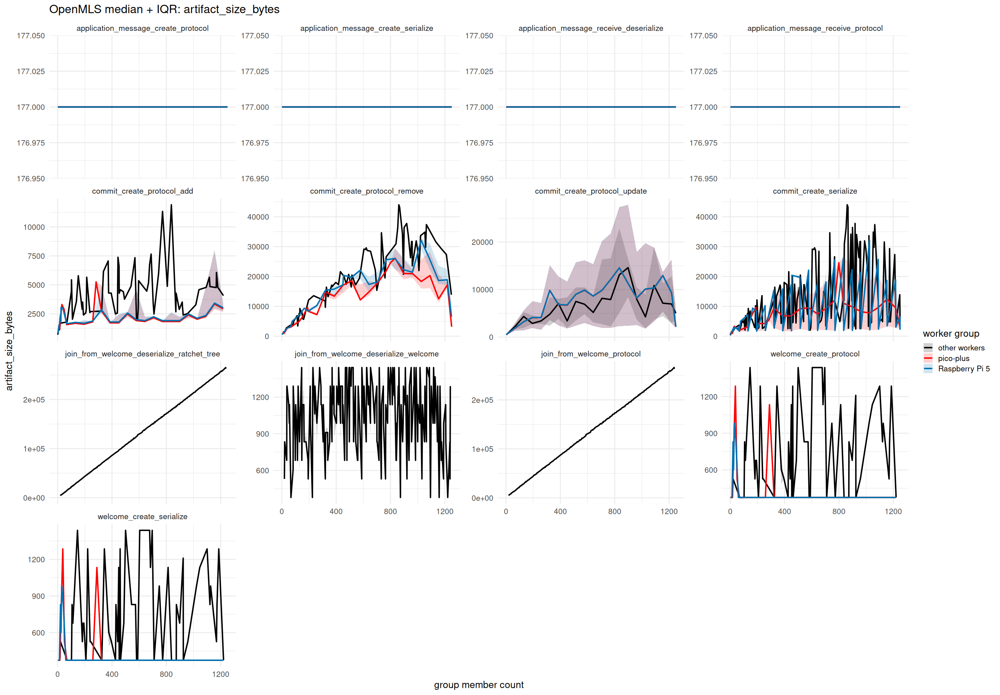

...

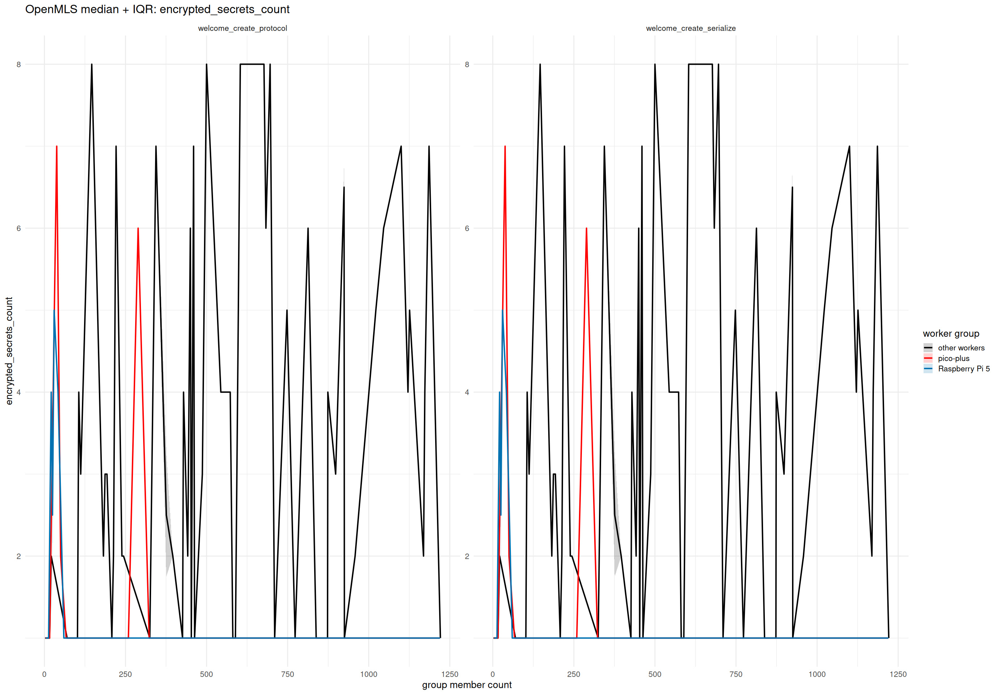

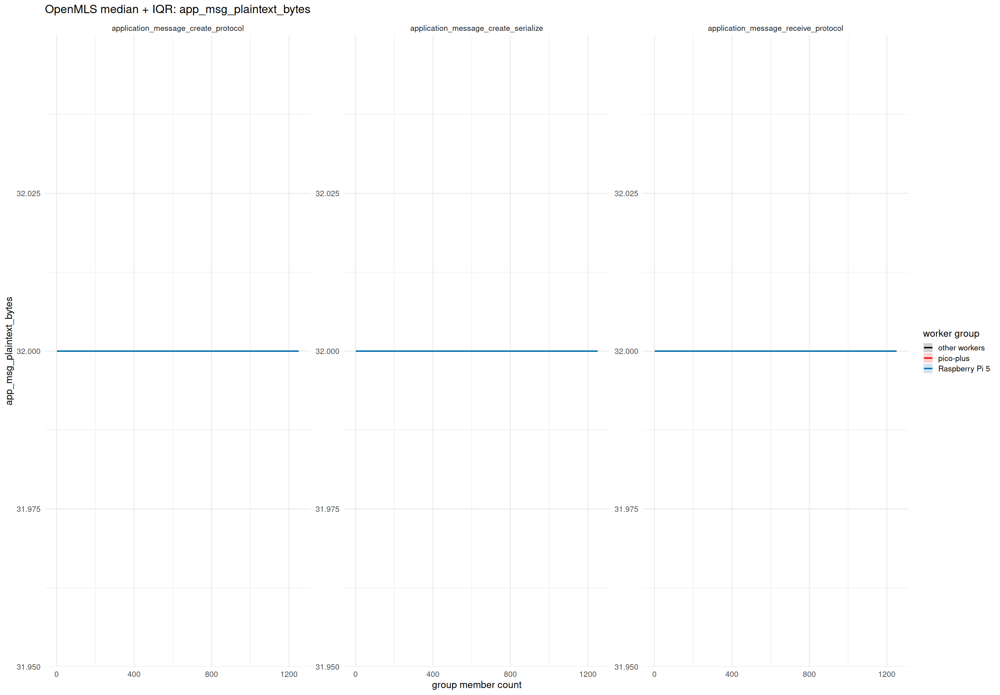

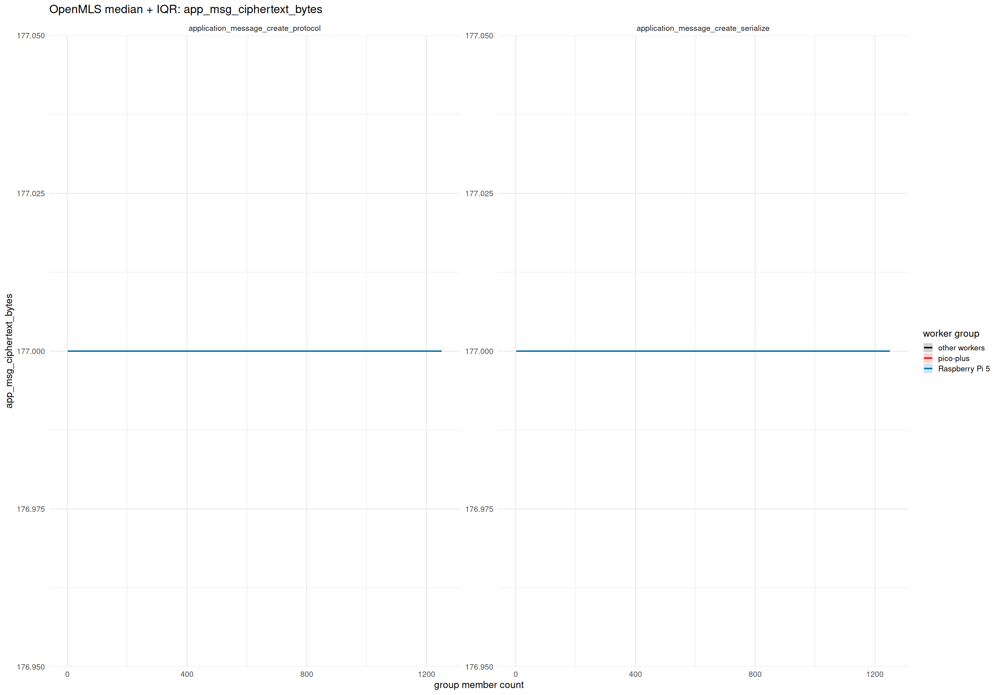

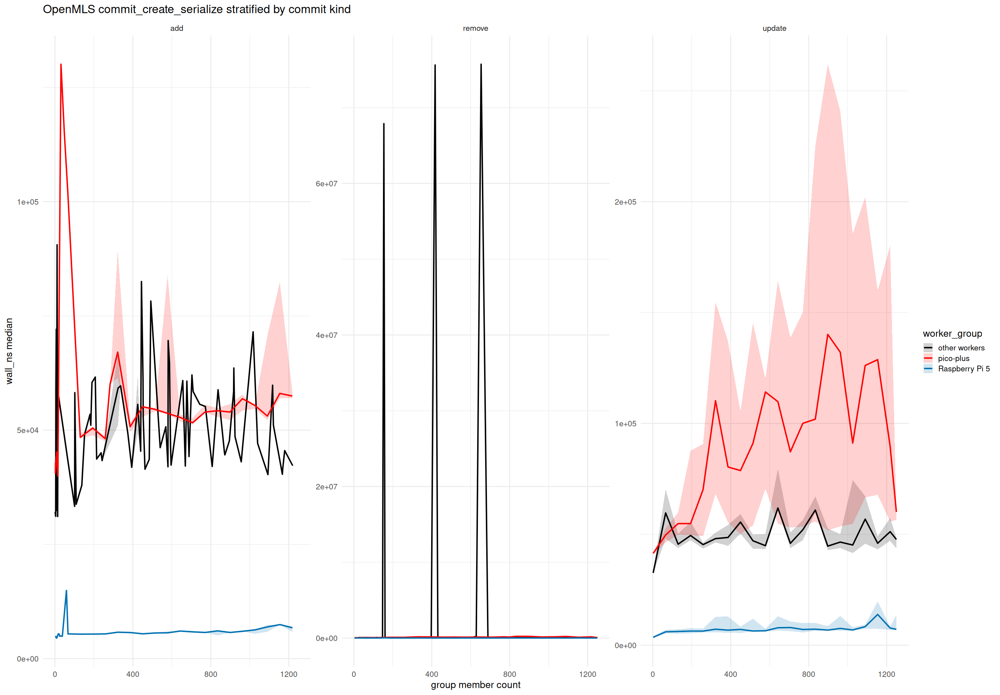

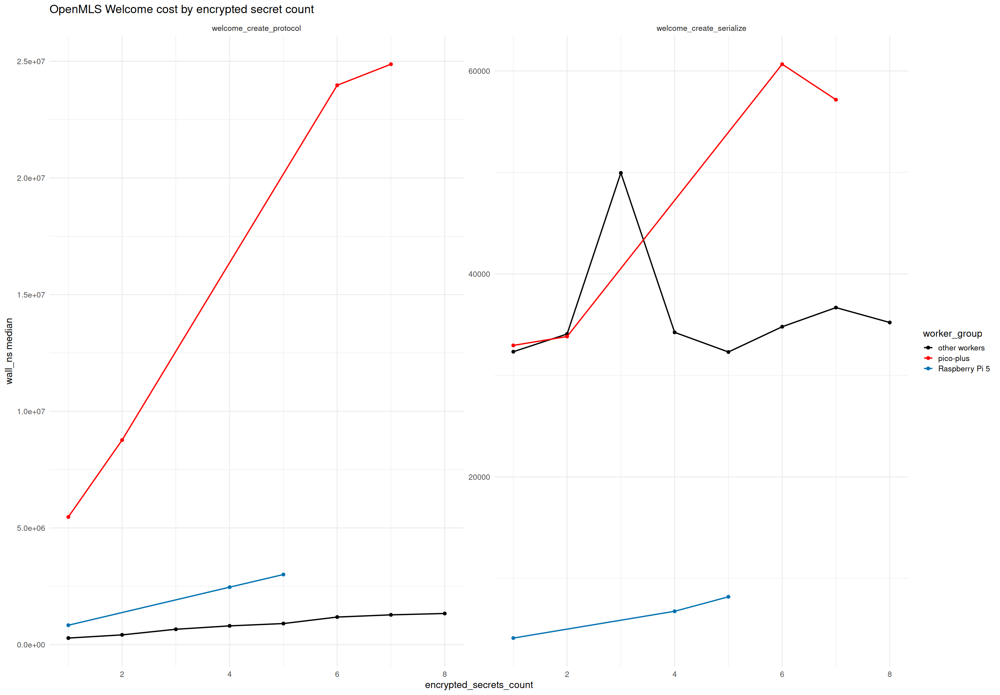

In [ ]:
library(dplyr)
library(tidyr)
library(purrr)
library(readr)
library(ggplot2)
library(glue)

openmls_worker_palette <- c(
  "other workers" = "black",
  "pico-plus" = "red",
  "Raspberry Pi 5" = "#0072B2"
)

classify_openmls_workers <- function(df) {
  if (!"client_id" %in% names(df)) df$client_id <- NA_character_
  if (!"worker_id" %in% names(df)) df$worker_id <- NA_character_
  if (!"device_kind" %in% names(df)) df$device_kind <- NA_character_

  df |>
    mutate(
      n_members = member_count,
      worker_group = case_when(
        !is.na(device_kind) & device_kind == "raspberry_pi_5" ~ "Raspberry Pi 5",
        !is.na(client_id) & grepl("^raspi5-", as.character(client_id)) ~ "Raspberry Pi 5",
        !is.na(worker_id) & grepl("^raspi5-", as.character(worker_id)) ~ "Raspberry Pi 5",
        !is.na(device_kind) & device_kind == "luckfox_pico_plus" ~ "pico-plus",
        !is.na(client_id) & grepl("^pico-plus-", as.character(client_id)) ~ "pico-plus",
        !is.na(worker_id) & grepl("^pico-plus-", as.character(worker_id)) ~ "pico-plus",
        TRUE ~ "other workers"
      ),
      worker_group = factor(worker_group, levels = names(openmls_worker_palette))
    )
}


read_openmls_enhanced <- function() {
  files <- Sys.glob("OpenMLS_containerized/benchmark_output/*/events.csv")
  if (length(files) == 0) stop("No OpenMLS events.csv files found")

  map_dfr(files, read_csv, show_col_types = FALSE, .id = "source_file") |>
    classify_openmls_workers()
}

omls_enhanced <- read_openmls_enhanced()

openmls_metrics <- c(
  "wall_ns",
  "cpu_thread_ns",
  "alloc_bytes",
  "alloc_count",
  "artifact_size_bytes",
  "welcome_bytes",
  "ratchet_tree_bytes",
  "welcome_plus_ratchet_tree_bytes",
  "encrypted_group_info_bytes",
  "encrypted_secrets_count",
  "app_msg_plaintext_bytes",
  "app_msg_ciphertext_bytes"
)

present_metrics <- intersect(openmls_metrics, names(omls_enhanced))

openmls_missingness <- omls_enhanced |>
  select(worker_group, op, all_of(present_metrics)) |>
  pivot_longer(all_of(present_metrics), names_to = "metric", values_to = "value") |>
  group_by(worker_group, op, metric) |>
  summarise(
    rows = n(),
    non_missing = sum(!is.na(value)),
    missing = sum(is.na(value)),
    pct_missing = 100 * missing / rows,
    .groups = "drop"
  ) |>
  arrange(op, metric, worker_group)

print(openmls_missingness, n = Inf)

ci95 <- function(x) {
  x <- x[!is.na(x)]
  n <- length(x)
  if (n == 0) return(tibble(n = 0, mean = NA_real_, ci95_low = NA_real_, ci95_high = NA_real_))
  m <- mean(x)
  s <- sd(x)
  h <- if_else(n > 1, 1.96 * s / sqrt(n), 0)
  tibble(n = n, mean = m, ci95_low = m - h, ci95_high = m + h)
}

openmls_summary <- omls_enhanced |>
  select(worker_group, op, n_members, all_of(present_metrics), invitee_count, encrypted_secrets_count) |>
  pivot_longer(all_of(present_metrics), names_to = "metric", values_to = "value") |>
  group_by(worker_group, op, metric, n_members) |>
  summarise(
    n = sum(!is.na(value)),
    mean = mean(value, na.rm = TRUE),
    median = median(value, na.rm = TRUE),
    q25 = quantile(value, 0.25, na.rm = TRUE),
    q75 = quantile(value, 0.75, na.rm = TRUE),
    iqr = IQR(value, na.rm = TRUE),
    sd = sd(value, na.rm = TRUE),
    ci95_low = mean - 1.96 * sd / sqrt(n),
    ci95_high = mean + 1.96 * sd / sqrt(n),
    .groups = "drop"
  ) |>
  mutate(across(c(mean, median, q25, q75, iqr, sd, ci95_low, ci95_high), ~ if_else(is.nan(.x), NA_real_, .x)))

print(openmls_summary |> filter(n > 0), n = 100)

plot_openmls_metric_iqr <- function(metric_name) {
  plot_data <- openmls_summary |>
    filter(metric == metric_name, n > 0, !is.na(n_members))

  ggplot(plot_data, aes(x = n_members, color = worker_group, fill = worker_group, group = worker_group)) +
    geom_ribbon(aes(ymin = q25, ymax = q75), alpha = 0.18, color = NA) +
    geom_line(aes(y = median), linewidth = 1.1) +
    facet_wrap(~op, scales = "free_y") +
    scale_color_manual(values = openmls_worker_palette, drop = FALSE) +
    scale_fill_manual(values = openmls_worker_palette, drop = FALSE) +
    labs(
      title = glue("OpenMLS median + IQR: {metric_name}"),
      x = "group member count",
      y = metric_name,
      color = "worker group",
      fill = "worker group"
    ) +
    theme_minimal(base_size = 16)
}

for (metric_name in present_metrics) {
  print(plot_openmls_metric_iqr(metric_name))
}

commit_serialize_stratified <- omls_enhanced |>
  filter(op == "commit_create_serialize") |>
  mutate(commit_kind = case_when(
    invitee_count > 0 ~ "add",
    invitee_count < 0 ~ "remove",
    invitee_count == 0 ~ "update",
    TRUE ~ "unknown"
  )) |>
  group_by(worker_group, commit_kind, n_members) |>
  summarise(
    rows = n(),
    wall_median = median(wall_ns, na.rm = TRUE),
    wall_q25 = quantile(wall_ns, 0.25, na.rm = TRUE),
    wall_q75 = quantile(wall_ns, 0.75, na.rm = TRUE),
    artifact_median = median(artifact_size_bytes, na.rm = TRUE),
    .groups = "drop"
  )

ggplot(commit_serialize_stratified, aes(x = n_members, color = worker_group, fill = worker_group)) +
  geom_ribbon(aes(ymin = wall_q25, ymax = wall_q75), alpha = 0.18, color = NA) +
  geom_line(aes(y = wall_median), linewidth = 1.1) +
  facet_wrap(~commit_kind, scales = "free_y") +
  scale_color_manual(values = openmls_worker_palette, drop = FALSE) +
  scale_fill_manual(values = openmls_worker_palette, drop = FALSE) +
  labs(title = "OpenMLS commit_create_serialize stratified by commit kind", x = "group member count", y = "wall_ns median") +
  theme_minimal(base_size = 16)

welcome_by_invitee <- omls_enhanced |>
  filter(op %in% c("welcome_create_protocol", "welcome_create_serialize")) |>
  group_by(worker_group, op, invitee_count, encrypted_secrets_count) |>
  summarise(
    rows = n(),
    wall_median = median(wall_ns, na.rm = TRUE),
    wall_q25 = quantile(wall_ns, 0.25, na.rm = TRUE),
    wall_q75 = quantile(wall_ns, 0.75, na.rm = TRUE),
    artifact_median = median(artifact_size_bytes, na.rm = TRUE),
    welcome_median = median(welcome_bytes, na.rm = TRUE),
    .groups = "drop"
  )

ggplot(welcome_by_invitee, aes(x = encrypted_secrets_count, y = wall_median, color = worker_group)) +
  geom_point(size = 2) +
  geom_line(aes(group = worker_group), linewidth = 1) +
  facet_wrap(~op, scales = "free_y") +
  scale_color_manual(values = openmls_worker_palette, drop = FALSE) +
  labs(title = "OpenMLS Welcome cost by encrypted secret count", x = "encrypted_secrets_count", y = "wall_ns median") +
  theme_minimal(base_size = 16)


# A tibble: 52 × 8
   op                 metric_label  rows  median     q25     q75     p95     max
   <chr>              <fct>        <int>   <dbl>   <dbl>   <dbl>   <dbl>   <dbl>
 1 application_messa… CPU envelop…   120 4.24e+0 4.19e+0 4.30e+0 4.43e+0 6.09e+0
 2 application_messa… CPU throttl…   120 0       0       0       0       0      
 3 application_messa… RAM RSS del…   120 4.10e+3 0       5.12e+3 8.19e+3 2.46e+4
 4 application_messa… RAM RSS uti…   120 2.79e-2 2.35e-2 2.91e-2 3.00e-2 3.09e-2
 5 application_messa… CPU envelop…   120 6.20e+0 6.00e+0 6.30e+0 6.59e+0 7.83e+0
 6 application_messa… CPU throttl…   120 0       0       0       0       0      
 7 application_messa… RAM RSS del…   120 0       0       0       0       0      
 8 application_messa… RAM RSS uti…   120 2.79e-2 2.35e-2 2.91e-2 3.00e-2 3.09e-2
 9 application_messa… CPU envelop…   352 5.55e+0 5.36e+0 5.76e+0 6.13e+0 7.21e+0
10 application_messa… CPU throttl…   352 0       0       0       0       0      
11 applic

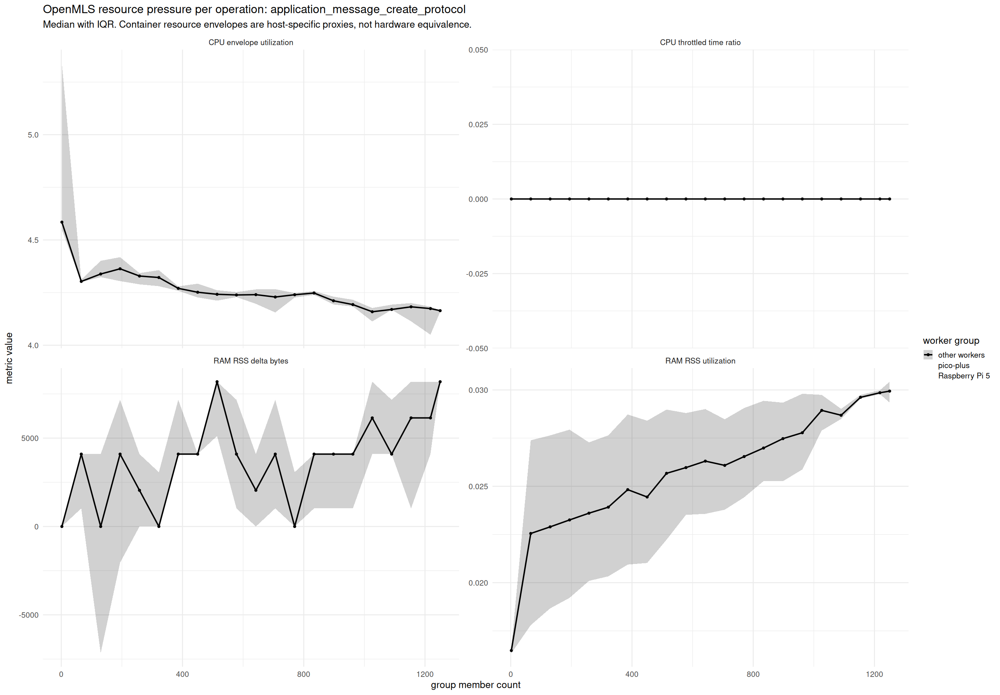

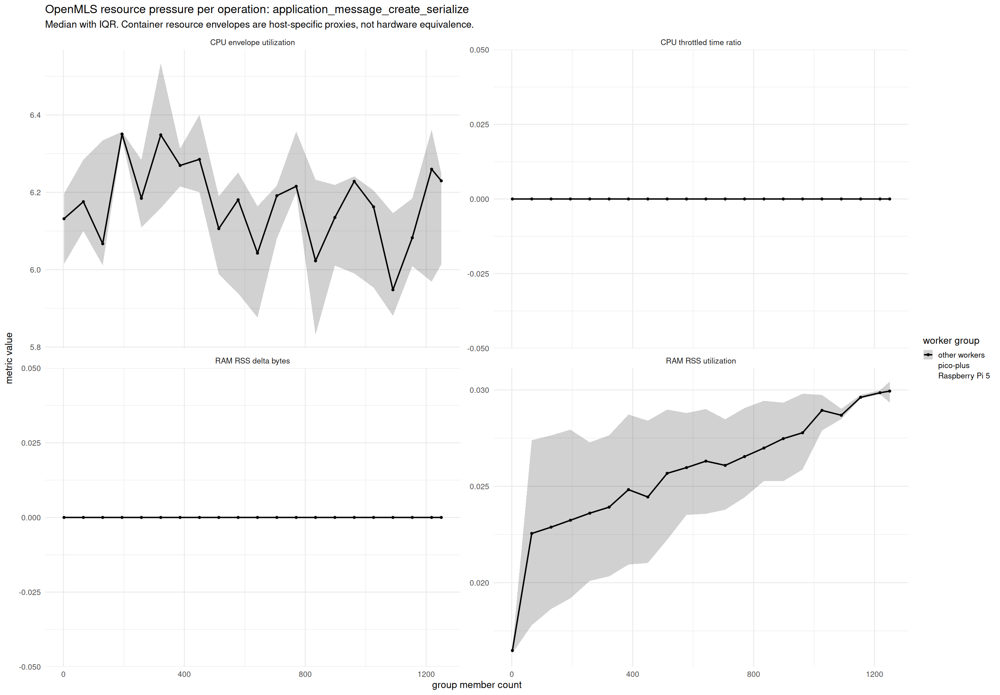

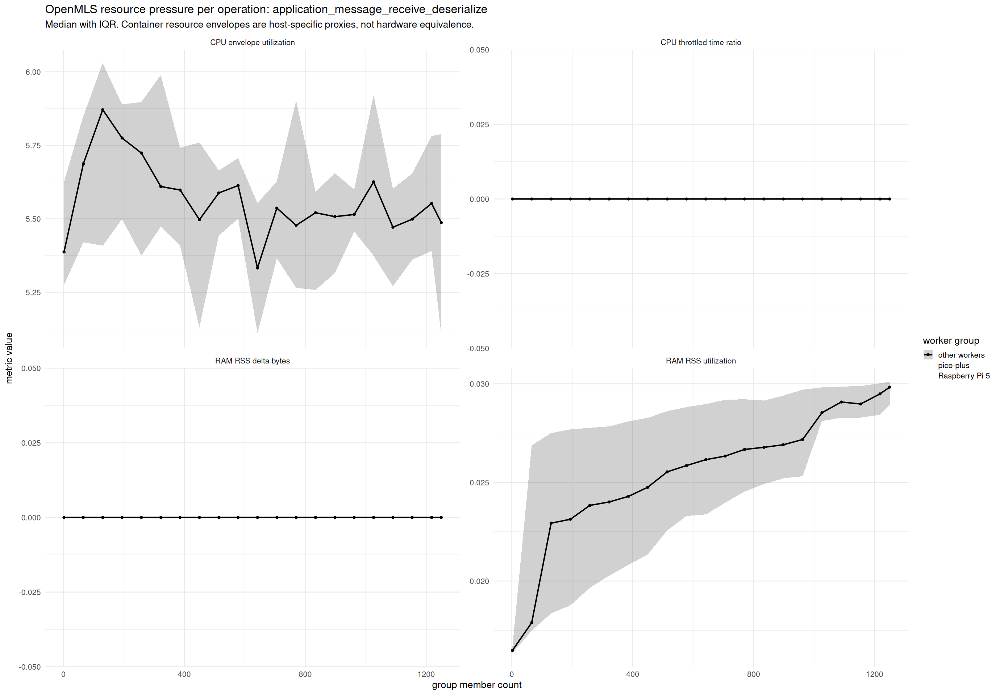

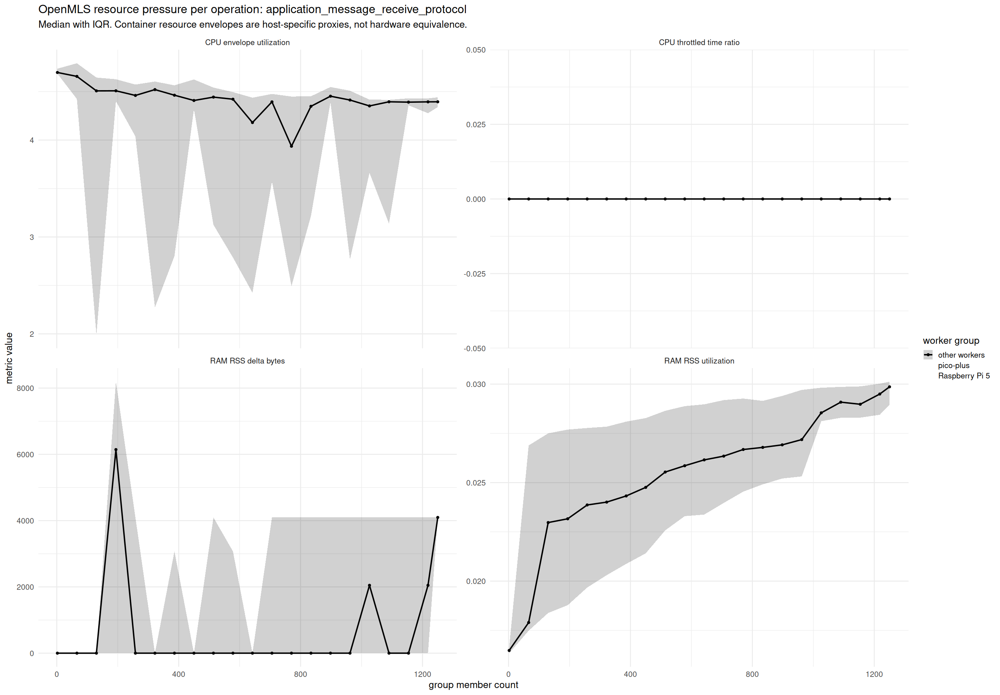

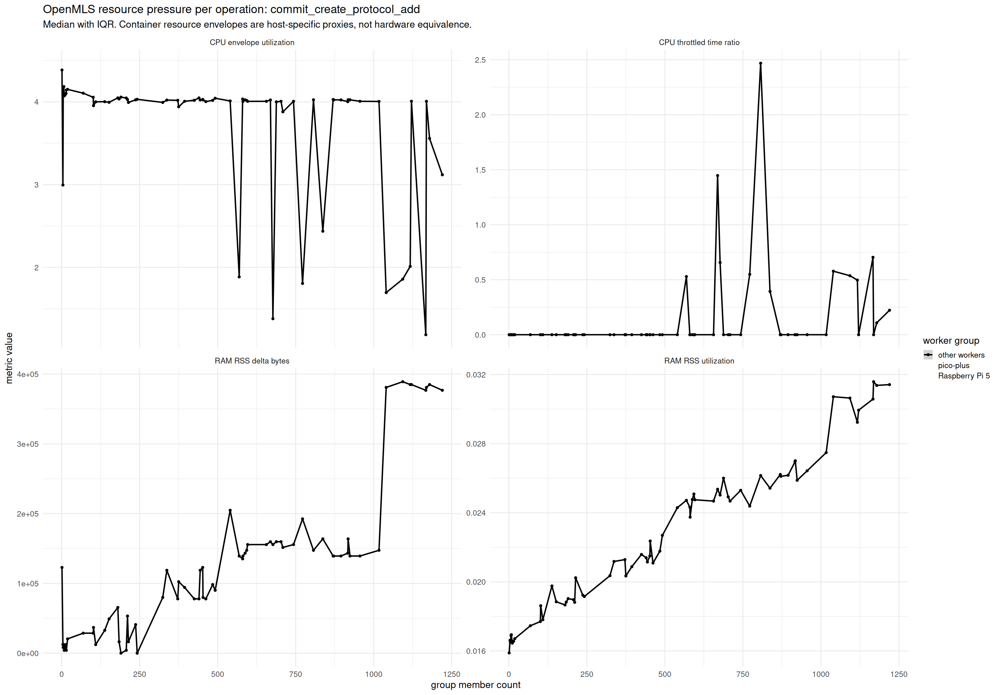

...

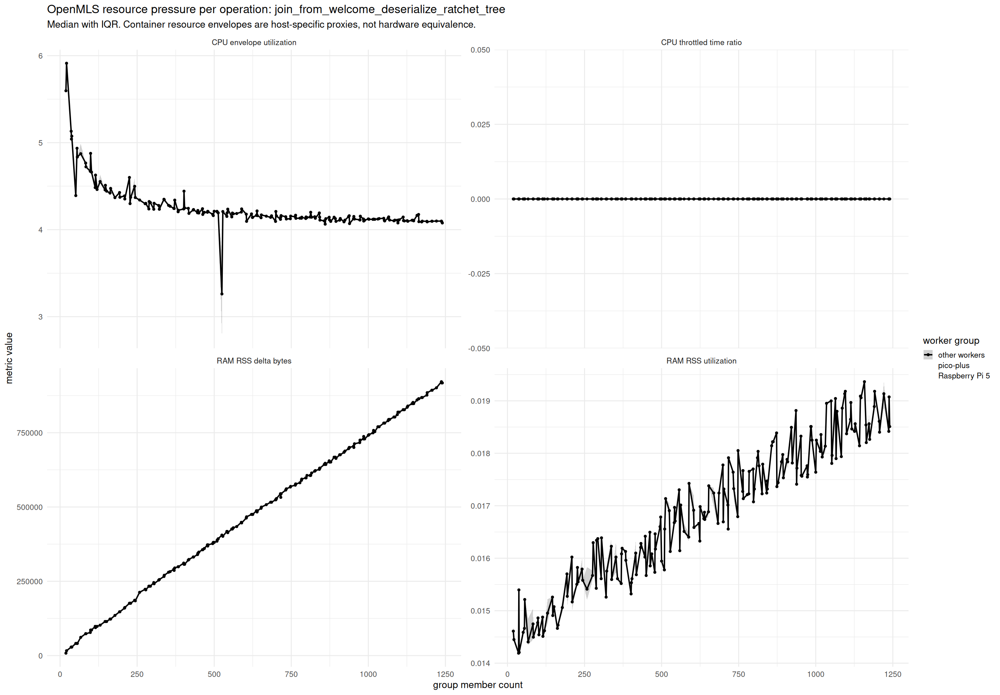

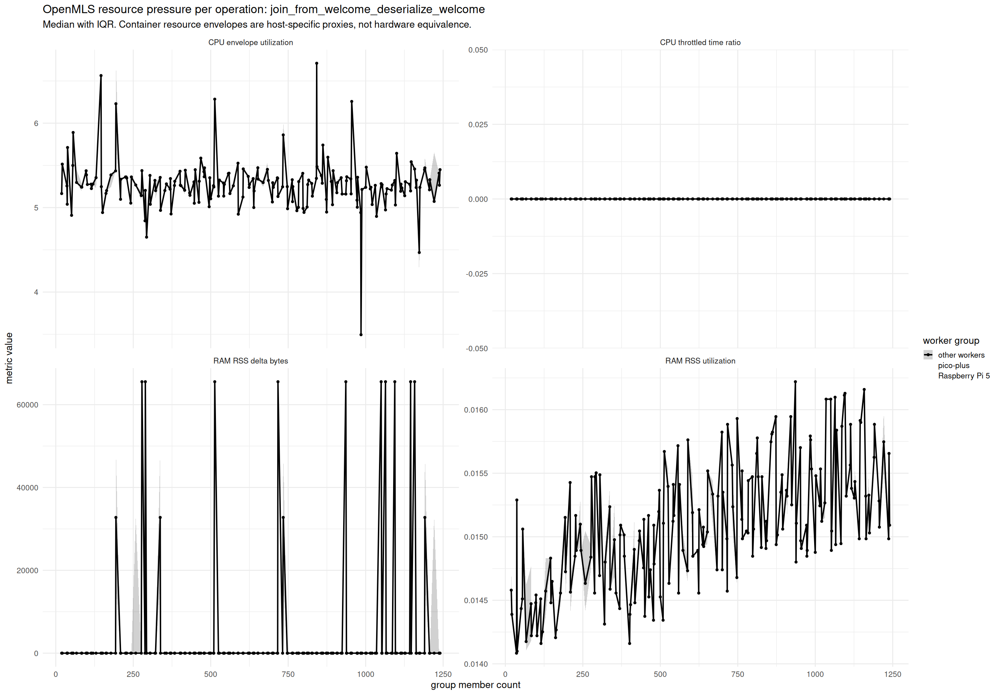

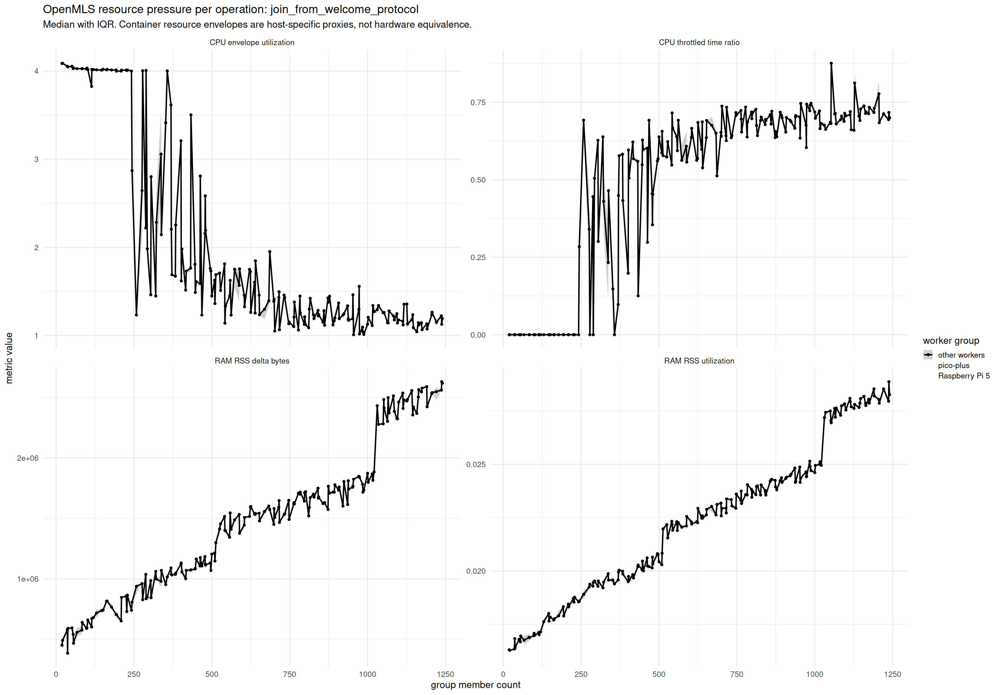

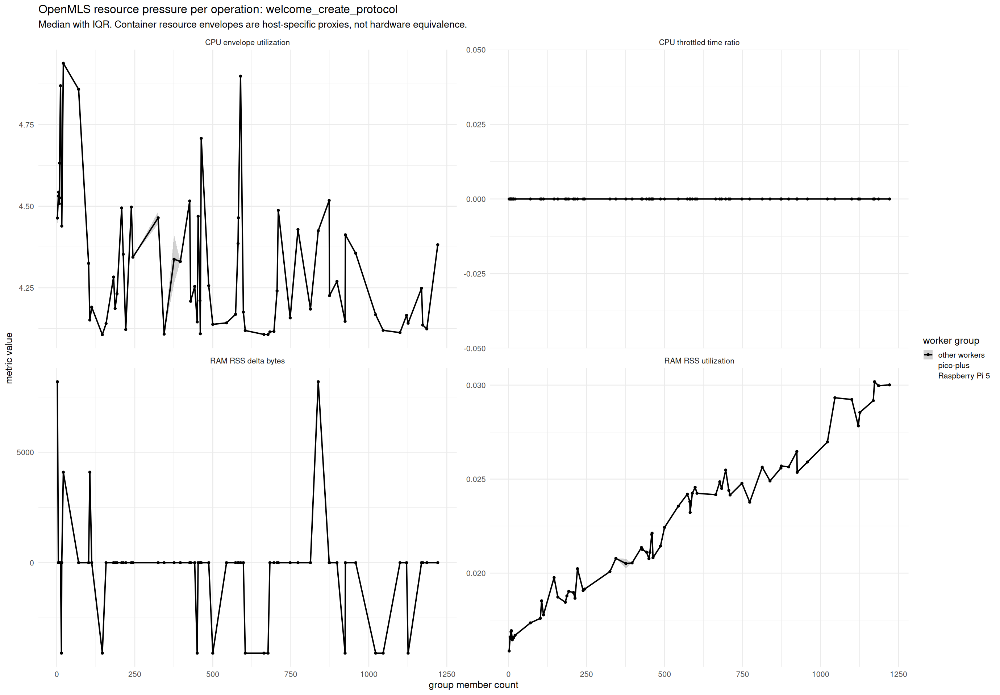

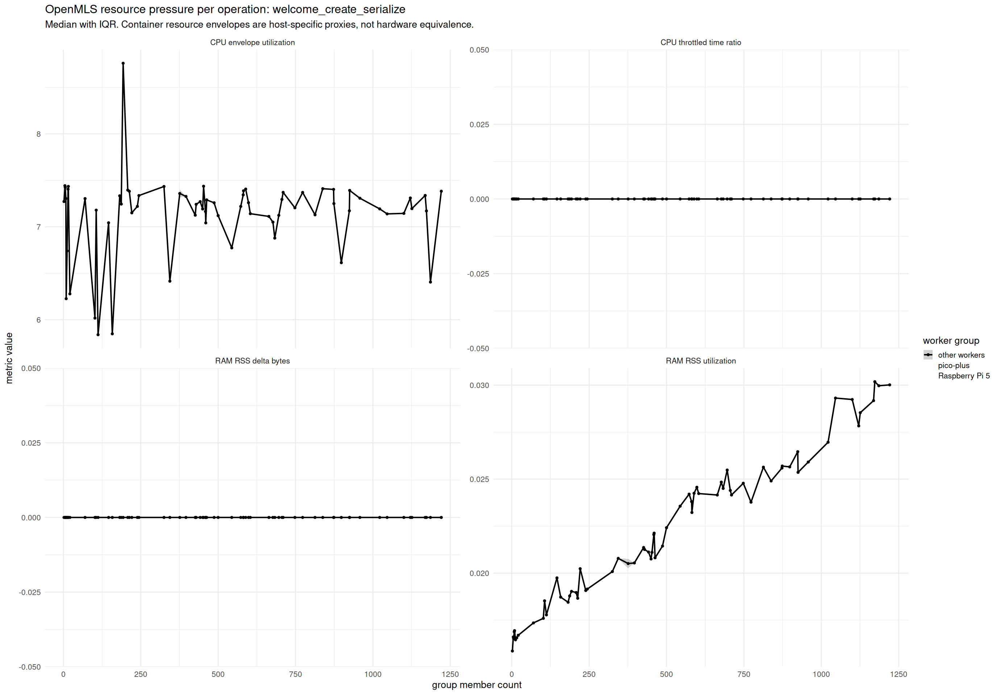

In [ ]:
library(dplyr)
library(readr)
library(purrr)
library(tidyr)
library(ggplot2)
library(glue)

options(repr.plot.width = 23, repr.plot.height = 16)

# OpenMLS only: operation-attributed resource pressure metrics from events.csv.
openmls_resource_metrics <- c(
  "cpu_envelope_utilization",
  "cpu_throttled_time_ratio",
  "ram_rss_delta_bytes",
  "ram_rss_utilization"
)

openmls_resource_metric_labels <- c(
  cpu_envelope_utilization = "CPU envelope utilization",
  cpu_throttled_time_ratio = "CPU throttled time ratio",
  ram_rss_delta_bytes = "RAM RSS delta bytes",
  ram_rss_utilization = "RAM RSS utilization"
)

openmls_resource_files <- unique(c(
  Sys.glob("OpenMLS_containerized/benchmark_output/*/events.csv"),
  Sys.glob("OpenMLS_containerized/OpenMLS_containerized/benchmark_output/*/events.csv")
))

if (length(openmls_resource_files) == 0) {
  stop("No OpenMLS events.csv files found")
}

omls_resource <- map_dfr(openmls_resource_files, function(path) {
  read_csv(path, show_col_types = FALSE) |>
    mutate(source_path = path, source_run = basename(dirname(path)))
})

if (!"op" %in% names(omls_resource)) stop("OpenMLS events.csv is missing op")
if (!"member_count" %in% names(omls_resource)) stop("OpenMLS events.csv is missing member_count")

for (col in c("client_id", "worker_id", "device_kind")) {
  if (!col %in% names(omls_resource)) omls_resource[[col]] <- NA_character_
}

present_resource_metrics <- intersect(openmls_resource_metrics, names(omls_resource))
missing_resource_metrics <- setdiff(openmls_resource_metrics, present_resource_metrics)
if (length(missing_resource_metrics) > 0) {
  message("Missing OpenMLS resource metric columns: ", paste(missing_resource_metrics, collapse = ", "))
}
if (length(present_resource_metrics) == 0) {
  stop("No OpenMLS resource metric columns are present. Re-run OpenMLS with the refactored profiler first.")
}

openmls_resource_worker_palette <- c(
  "other workers" = "black",
  "pico-plus" = "red",
  "Raspberry Pi 5" = "#0072B2"
)

omls_resource_long <- omls_resource |>
  mutate(
    n_members = member_count,
    worker_group = case_when(
      !is.na(device_kind) & device_kind == "raspberry_pi_5" ~ "Raspberry Pi 5",
      !is.na(client_id) & grepl("^raspi5-", as.character(client_id)) ~ "Raspberry Pi 5",
      !is.na(worker_id) & grepl("^raspi5-", as.character(worker_id)) ~ "Raspberry Pi 5",
      !is.na(device_kind) & device_kind == "luckfox_pico_plus" ~ "pico-plus",
      !is.na(client_id) & grepl("^pico-plus-", as.character(client_id)) ~ "pico-plus",
      !is.na(worker_id) & grepl("^pico-plus-", as.character(worker_id)) ~ "pico-plus",
      TRUE ~ "other workers"
    ),
    worker_group = factor(worker_group, levels = names(openmls_resource_worker_palette))
  ) |>
  pivot_longer(
    all_of(present_resource_metrics),
    names_to = "metric",
    values_to = "value"
  ) |>
  filter(!is.na(value)) |>
  mutate(
    metric_label = unname(openmls_resource_metric_labels[metric]),
    metric_label = if_else(is.na(metric_label), metric, metric_label),
    metric_label = factor(metric_label, levels = unname(openmls_resource_metric_labels[present_resource_metrics]))
  )

openmls_resource_operation_summary <- omls_resource_long |>
  group_by(op, metric_label) |>
  summarise(
    rows = n(),
    median = median(value, na.rm = TRUE),
    q25 = quantile(value, 0.25, na.rm = TRUE),
    q75 = quantile(value, 0.75, na.rm = TRUE),
    p95 = quantile(value, 0.95, na.rm = TRUE),
    max = max(value, na.rm = TRUE),
    .groups = "drop"
  ) |>
  arrange(op, metric_label)

print(openmls_resource_operation_summary, n = Inf)

openmls_resource_by_operation <- omls_resource_long |>
  group_by(worker_group, op, metric_label, n_members) |>
  summarise(
    n = n(),
    median = median(value, na.rm = TRUE),
    q25 = quantile(value, 0.25, na.rm = TRUE),
    q75 = quantile(value, 0.75, na.rm = TRUE),
    .groups = "drop"
  ) |>
  filter(n > 0, !is.na(n_members))

for (operation in sort(unique(openmls_resource_by_operation$op))) {
  plot_data <- openmls_resource_by_operation |>
    filter(op == operation)

  p <- ggplot(
    plot_data,
    aes(
      x = n_members,
      color = worker_group,
      fill = worker_group,
      group = worker_group
    )
  ) +
    geom_ribbon(aes(ymin = q25, ymax = q75), alpha = 0.18, color = NA) +
    geom_line(aes(y = median), linewidth = 1.1) +
    geom_point(aes(y = median), size = 1.4) +
    facet_wrap(~metric_label, scales = "free_y", labeller = label_wrap_gen(width = 32)) +
    scale_color_manual(values = openmls_resource_worker_palette, drop = FALSE) +
    scale_fill_manual(values = openmls_resource_worker_palette, drop = FALSE) +
    labs(
      title = glue("OpenMLS resource pressure per operation: {operation}"),
      subtitle = "Median with IQR. Container resource envelopes are host-specific proxies, not hardware equivalence.",
      x = "group member count",
      y = "metric value",
      color = "worker group",
      fill = "worker group"
    ) +
    theme_minimal(base_size = 16)

  print(p)
}
